In [ ]:
################################################################################
######################  Lending Tree Loan Status  ##############################
######################   Classification - Linear  ##############################
######################         HPO GPU            ##############################
################################################################################

In [1]:
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd /content/drive/MyDrive/LoanStatus/ML/RAPIDS/

/content/drive/MyDrive/LoanStatus/ML/RAPIDS


In [ ]:
# Clone RAPIDS-Colab install files and see if GPU is compatible
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/env-check.py

In [ ]:
# Update the Colab environment and restart the kernel
!bash rapidsai-csp-utils/colab/update_gcc.sh
import os
os._exit(00)

In [3]:
# Install CondaColab and restart the kernel 
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/latest/download/Mambaforge-colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:29
🔁 Restarting kernel...


In [3]:
# See if environment is ready to install RAPIDS
import condacolab
condacolab.check()

✨🍰✨ Everything looks OK!


In [4]:
# Install RAPIDS using the 'stable' release
!python rapidsai-csp-utils/colab/install_rapids.py stable
import os
os.environ['NUMBAPRO_NVVM'] = '/usr/local/cuda/nvvm/lib64/libnvvm.so'
os.environ['NUMBAPRO_LIBDEVICE'] = '/usr/local/cuda/nvvm/libdevice/'
os.environ['CONDA_PREFIX'] = '/usr/local'

Found existing installation: cffi 1.14.5
Uninstalling cffi-1.14.5:
  Successfully uninstalled cffi-1.14.5
Found existing installation: cryptography 3.4.5
Uninstalling cryptography-3.4.5:
  Successfully uninstalled cryptography-3.4.5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Installing RAPIDS Stable 21.12
Starting the RAPIDS install on Colab.  This will take about 15 minutes.
Solving environment: ...working... WARNING conda.core.solve:_add_specs(611): pinned spec cudatoolkit=11.1 conflicts with explicit specs.  Overriding pinned spec.
failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... WARNING conda.core.solve:_add_specs(611): pinned spec cudatoolkit=11.1 conflicts with explicit specs.  Overriding pinned spec.
failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... WARNING conda.core.solve:_add_specs(611): pinned spec c

In [5]:
# Install/import dependencies
!pip install optuna
!pip install dask_optuna
!pip install plotly
import os
import random
import time
from contextlib import contextmanager
import numpy as np
import cupy 
import cudf
import cuml
from dask.distributed import Client, wait
from dask_cuda import LocalCUDACluster
import dask, dask_cudf
from dask.diagnostics import ProgressBar
import dask_optuna
import urllib.request
from cuml.preprocessing import train_test_split
from cuml.linear_model import Ridge
from cuml.linear_model import Lasso
from cuml.linear_model import ElasticNet
import time
from datetime import datetime, timedelta
from timeit import default_timer as timer
import joblib
from joblib import parallel_backend
import optuna
from optuna import Trial
optuna.logging.set_verbosity(optuna.logging.WARNING) 
import pickle
import pandas as pd
import warnings
import sklearn
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
import plotly.offline as py
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

my_dpi=96

os.environ['CUDA_VISIBLE_DEVICES'] = '0'

print('\n')
!nvidia-smi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 308 kB 5.2 MB/s 
     |████████████████████████████████| 81 kB 10.0 MB/s 
     |████████████████████████████████| 1.6 MB 65.6 MB/s 
     |████████████████████████████████| 209 kB 48.9 MB/s 
     |████████████████████████████████| 150 kB 46.8 MB/s 
     |████████████████████████████████| 78 kB 401 kB/s 
     |████████████████████████████████| 49 kB 5.4 MB/s 
     |████████████████████████████████| 112 kB 43.0 MB/s 
     |████████████████████████████████| 146 kB 41.0 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=565149faf26994c283893aaeaea4d20d90dea306cce285e7dd32c0c1c6d72fd6
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/si

In [6]:
# Set up local CUDA cluster for Dask
cluster = LocalCUDACluster(threads_per_worker=1, ip='', dashboard_address='8081') 
c = Client(cluster)

# Query the client for all connected workers
workers = c.has_what().keys()
n_workers = len(workers)
c

Connection method: Cluster object,Cluster type: dask_cuda.LocalCUDACluster
Dashboard: http://172.28.0.2:8081/status,
Dashboard: http://172.28.0.2:8081/status,Workers: 1
Total threads: 1,Total memory: 25.46 GiB
Status: running,Using processes: True
Comm: tcp://172.28.0.2:36535,Workers: 1
Dashboard: http://172.28.0.2:8081/status,Total threads: 1
Started: Just now,Total memory: 25.46 GiB
Comm: tcp://172.28.0.2:43789,Total threads: 1
Dashboard: http://172.28.0.2:37765/status,Memory: 25.46 GiB
Nanny: tcp://172.28.0.2:32885,


In [7]:
# Define function to time code blocks
@contextmanager
def timed(name):
    t0 = time.time()
    yield
    t1 = time.time()
    print('..%-24s:  %8.4f' % (name, t1 - t0))

In [8]:
# Set seed 
seed_value = 42
os.environ['Linear_GPU'] = str(seed_value)
cupy.random.seed(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)

In [9]:
%cd /content/drive/MyDrive/LoanStatus/Data/

/content/drive/MyDrive/LoanStatus/Data


In [10]:
# Read data
trainDF = cudf.read_csv('trainDF_US.csv', low_memory=False)
print('Train set: Number of rows and columns:', trainDF.shape)

testDF  = cudf.read_csv('testDF_US.csv', low_memory=False)
print('Test set: Number of rows and columns:', testDF.shape)

Train set: Number of rows and columns: (3022132, 51)
Test set: Number of rows and columns: (432473, 51)


In [11]:
# Find categorical variables
cat_cols = list(trainDF.select_dtypes('object').columns)
cat_cols1 = list(testDF.select_dtypes('object').columns)

# Set up features and target
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [12]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
################################################################################
######################  Lending Tree Loan Status  ##############################
######################   Classification - Linear  ##############################
######################       Ridge HPO GPU        ##############################
################################################################################

In [ ]:
################################################################################
######################         F1 Weighted        ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_ridge_optuna_US_1000_weightedF1_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, solver='eig', 
                   fit_intercept=True, normalize=False, verbose=0, handle=None):
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Weighted F1 score of the fitted model
    '''

    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')


    model = Ridge(alpha=alpha, solver=solver, 
                   fit_intercept=fit_intercept, normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = f1_score(y_test.to_numpy(), cupy.asnumpy(y_pred), average='weighted') 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted F1:', score)
    print('######################################################')

    return score

In [ ]:
# With fit_intercept=False, normalize=True
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.3213259199997083
- Trial weighted F1: 0.9195943977103406
######################################################
Score with default parameters :  0.9195943977103406


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
  
    joblib.dump(study, 'Ridge_Optuna_US_1000_GPU_weightedF1.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 0, 10) 
    solver = trial.suggest_categorical('solver', ['eig', 'svd'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, solver=solver, 
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Ridge_Optuna_US_1000_GPU_weightedF1.pkl'): 
        study = joblib.load('Ridge_Optuna_US_1000_GPU_weightedF1.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)


# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest F1 weighted', study.best_value)

Start Time           2022-06-12 14:48:30.045027
- Trial time: 0.6742211719997613
- Trial weighted F1: 0.9648692737989603
######################################################
- Trial time: 0.6929510459999619
- Trial weighted F1: 0.9648692737989603
######################################################
- Trial time: 0.6620594969999729
- Trial weighted F1: 0.9648692737989603
######################################################
- Trial time: 0.30611110199970426
- Trial weighted F1: 0.9195982909441779
######################################################
- Trial time: 0.6454405409999708
- Trial weighted F1: 0.9648692737989603
######################################################
- Trial time: 0.30573263799988126
- Trial weighted F1: 0.9195943977103406
######################################################
- Trial time: 0.307125588999952
- Trial weighted F1: 0.9195943977103406
######################################################
- Trial time: 0.3031604029997652
- Trial weighted F1: 0

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'f1_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_solver':'solver'}, inplace=True)

trials_df = trials_df.sort_values('f1_weighted', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Ridge_Optuna_US_1000_GPU_weightedF1.csv', index=False)

     iteration  f1_weighted             datetime_start  \
514        514     0.919594 2022-06-12 14:55:49.320333   
297        297     0.919594 2022-06-12 14:52:36.547690   
729        729     0.919594 2022-06-12 14:59:10.728326   
747        747     0.919594 2022-06-12 14:59:27.971472   
766        766     0.919594 2022-06-12 14:59:46.240652   
..         ...          ...                        ...   
351        351     0.964869 2022-06-12 14:53:23.518499   
352        352     0.964869 2022-06-12 14:53:24.401812   
353        353     0.964869 2022-06-12 14:53:25.290321   
324        324     0.964869 2022-06-12 14:52:59.662006   
999        999     0.964869 2022-06-12 15:03:37.625413   

             datetime_complete               duration     alpha solver  \
514 2022-06-12 14:55:49.879716 0 days 00:00:00.559383  2.118362    eig   
297 2022-06-12 14:52:37.076294 0 days 00:00:00.528604  6.645767    eig   
729 2022-06-12 14:59:11.335695 0 days 00:00:00.607369  3.332819    eig   
747 202

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'solver'])
py.plot(fig, filename='contour_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

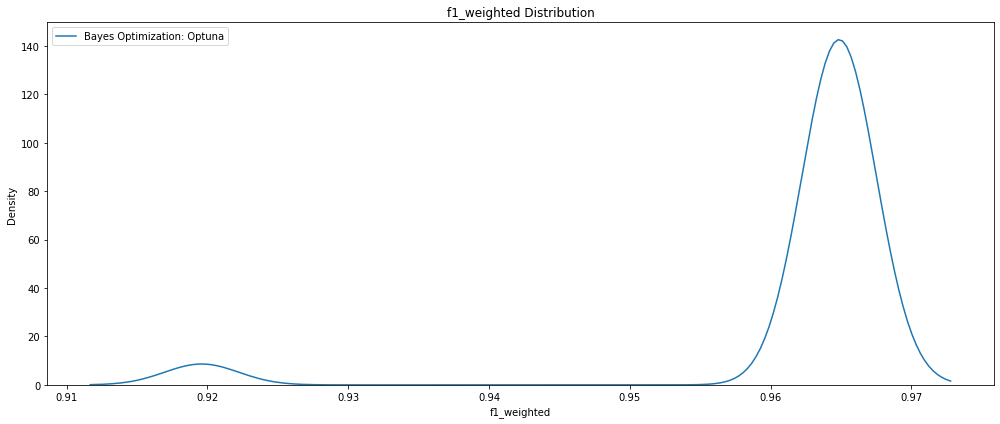

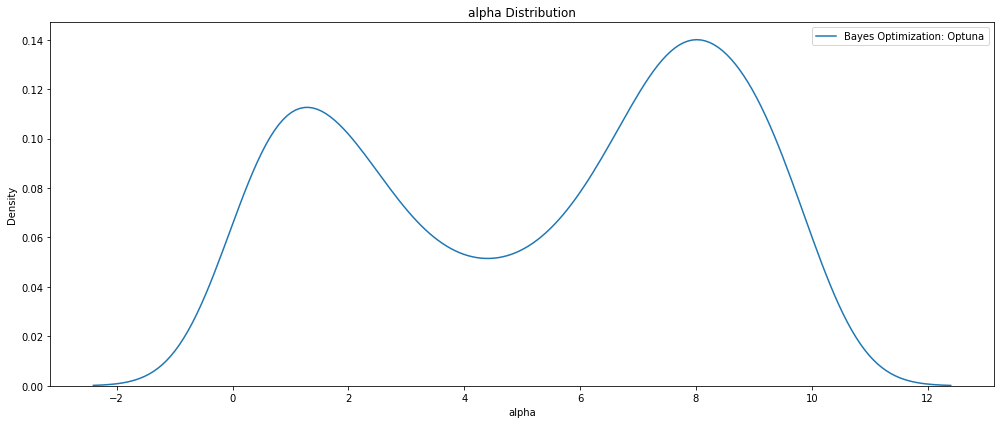

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','solver', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Ridge_Optuna_US_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 1.9234285838427267, 'solver': 'svd'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Ridge(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Ridge_Optuna_US_trials1000_GPU_weightedF1.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Ridge_Optuna_US_trials1000_GPU_weightedF1.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Ridge HPO 1000 GPU F1 Weighted')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Ridge HPO 1000 GPU F1 Weighted


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    377848
           1       0.86      0.86      0.86     54625

    accuracy                           0.96    432473
   macro avg       0.92      0.92      0.92    432473
weighted avg       0.96      0.96      0.96    432473



Confusion matrix:
[[370492   7356]
 [  7810  46815]]


Accuracy score : 0.965
Precision score : 0.864
Recall score : 0.857
F1 score : 0.861


In [ ]:
# Evaluate on the testing data 
print('The best model from Ridge HPO 1000 GPU F1 Weighted trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Ridge HPO 1000 GPU F1 Weighted trials optimization scores 0.91878 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   514
f1_weighted                            0.919594
datetime_start       2022-06-12 14:55:49.320333
datetime_complete    2022-06-12 14:55:49.879716
duration                 0 days 00:00:00.559383
alpha                                  2.118362
solver                                      eig
state                                  COMPLETE
Name: 514, dtype: object


In [ ]:
################################################################################
######################         ROC Weighted       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_ridge_optuna_US_1000_weightedROC_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, solver='eig', 
                   fit_intercept=True, normalize=False, verbose=0, handle=None):
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Weighted ROC score of the fitted model
    '''

    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')


    model = Ridge(alpha=alpha, solver=solver, 
                   fit_intercept=fit_intercept, normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_pred), 
                          average='weighted')
     
    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted ROC:', score)
    print('######################################################')

    return score

In [ ]:
# With fit_intercept=False, normalize=True
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.23547736199998326
- Trial weighted ROC: 0.8794117831794821
######################################################
Score with default parameters :  0.8794117831794821


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Ridge_Optuna_US_1000_GPU_ROCweighted.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 0, 10) 
    solver = trial.suggest_categorical('solver', ['eig', 'svd'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, solver=solver, 
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Ridge_Optuna_US_1000_GPU_ROCweighted.pkl'): 
        study = joblib.load('Ridge_Optuna_US_1000_GPU_ROCweighted.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)


# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest ROCweighted score', study.best_value)

Start Time           2022-06-12 15:30:48.110439
- Trial time: 0.5845750819999012
- Trial weighted ROC: 0.9187785128518015
######################################################
- Trial time: 0.5920682839996516
- Trial weighted ROC: 0.9187785128518015
######################################################
- Trial time: 0.2275067760001548
- Trial weighted ROC: 0.8794117831794821
######################################################
- Trial time: 0.22518232200036437
- Trial weighted ROC: 0.8794117831794821
######################################################
- Trial time: 0.2254341479992945
- Trial weighted ROC: 0.8794117831794821
######################################################
- Trial time: 0.22462318599991704
- Trial weighted ROC: 0.8794117831794821
######################################################
- Trial time: 0.5747630519999802
- Trial weighted ROC: 0.9187785128518015
######################################################
- Trial time: 0.569368511999528
- Trial weighte

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'roc_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_solver':'solver'}, inplace=True)

trials_df = trials_df.sort_values('roc_weighted', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Ridge_Optuna_US_1000_GPU_ROCweighted.csv', index=False)

     iteration  roc_weighted             datetime_start  \
590        590      0.879412 2022-06-12 15:38:28.716976   
938        938      0.879412 2022-06-12 15:43:36.119234   
220        220      0.879412 2022-06-12 15:33:31.461270   
492        492      0.879412 2022-06-12 15:37:07.171963   
726        726      0.879412 2022-06-12 15:40:25.690368   
..         ...           ...                        ...   
351        351      0.918779 2022-06-12 15:35:13.394868   
352        352      0.918779 2022-06-12 15:35:14.193825   
353        353      0.918779 2022-06-12 15:35:14.997722   
324        324      0.918779 2022-06-12 15:34:52.048178   
999        999      0.918779 2022-06-12 15:44:32.477715   

             datetime_complete               duration     alpha solver  \
590 2022-06-12 15:38:29.221880 0 days 00:00:00.504904  2.591720    eig   
938 2022-06-12 15:43:36.694267 0 days 00:00:00.575033  0.558286    eig   
220 2022-06-12 15:33:31.888252 0 days 00:00:00.426982  5.456832    ei

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'solver'])
py.plot(fig, filename='contour_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

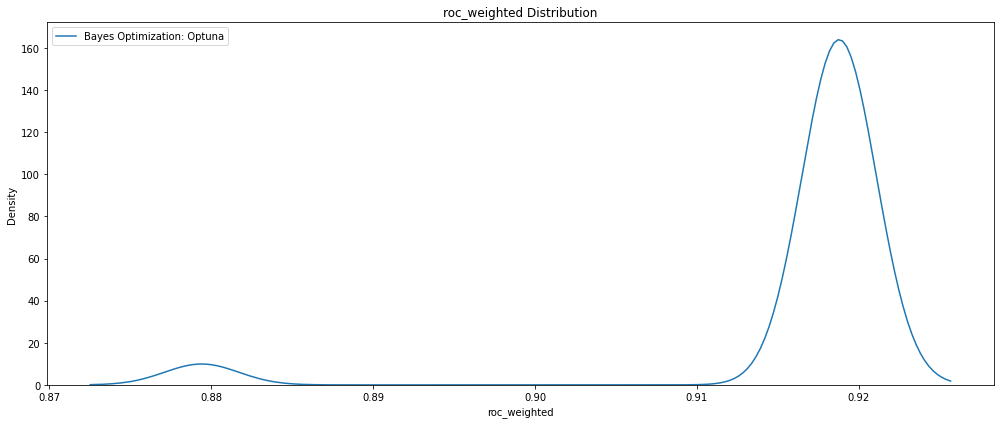

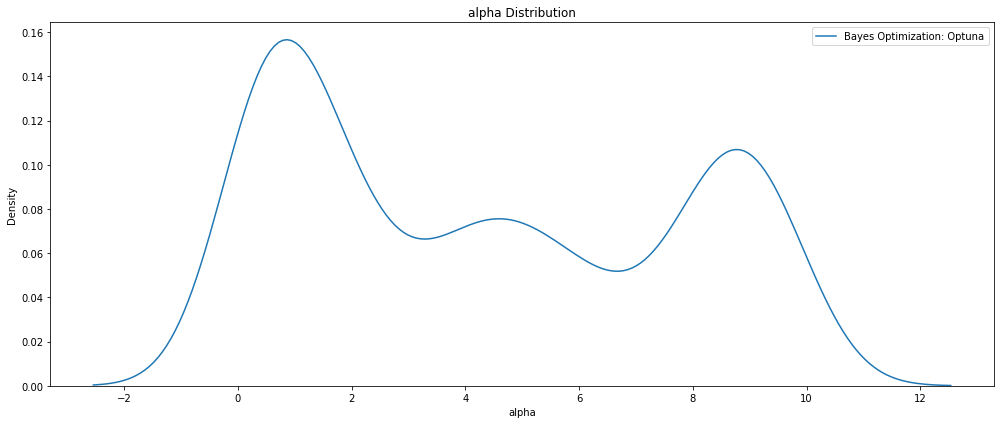

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','solver', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Ridge_Optuna_US_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 9.223782108345324, 'solver': 'svd'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Ridge(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Ridge_Optuna_US_trials1000_GPU_ROCweighted.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Ridge_Optuna_US_trials1000_GPU_ROCweighted.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Ridge HPO 1000 GPU ROC Weighted')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Ridge HPO 1000 GPU ROC Weighted


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    377848
           1       0.86      0.86      0.86     54625

    accuracy                           0.96    432473
   macro avg       0.92      0.92      0.92    432473
weighted avg       0.96      0.96      0.96    432473



Confusion matrix:
[[370492   7356]
 [  7810  46815]]


Accuracy score : 0.965
Precision score : 0.864
Recall score : 0.857
F1 score : 0.861


In [ ]:
# Evaluate on the testing data 
print('The best model from Ridge HPO 1000 GPU ROC Weighted trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Ridge HPO 1000 GPU ROC Weighted trials optimization scores 0.91878 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   590
roc_weighted                           0.879412
datetime_start       2022-06-12 15:38:28.716976
datetime_complete    2022-06-12 15:38:29.221880
duration                 0 days 00:00:00.504904
alpha                                   2.59172
solver                                      eig
state                                  COMPLETE
Name: 590, dtype: object


In [ ]:
################################################################################
######################         Recall Score       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_ridge_optuna_US_1000_Recall_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, solver='eig', 
                   fit_intercept=True, normalize=False, verbose=0, handle=None):
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Recall score of the fitted model
    '''

    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')


    model = Ridge(alpha=alpha, solver=solver, 
                  fit_intercept=fit_intercept, 
                  normalize=normalize, 
                  verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = recall_score(y_test.to_numpy(), cupy.asnumpy(y_pred))
     
    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial recall score:', score)
    print('######################################################')

    return score

In [ ]:
# With fit_intercept=False, normalize=True
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.30884718600009364
- Trial recall score: 0.8325675057208238
######################################################
Score with default parameters :  0.8325675057208238


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):

    joblib.dump(study, 'Ridge_Optuna_US_1000_GPU_Recall.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 0, 10) 
    solver = trial.suggest_categorical('solver', ['eig', 'svd'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, solver=solver, 
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Ridge_Optuna_US_1000_GPU_Recall.pkl'): 
        study = joblib.load('Ridge_Optuna_US_1000_GPU_Recall.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)


# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest Recall score', study.best_value)

Start Time           2022-06-12 15:52:11.335658
- Trial time: 0.30445590899944364
- Trial recall score: 0.8325675057208238
######################################################
- Trial time: 0.3086918019998848
- Trial recall score: 0.8325675057208238
######################################################
- Trial time: 0.298124409000593
- Trial recall score: 0.8325675057208238
######################################################
- Trial time: 0.2969721429999481
- Trial recall score: 0.8325675057208238
######################################################
- Trial time: 0.6622507749998476
- Trial recall score: 0.8570251716247139
######################################################
- Trial time: 0.3059798939993925
- Trial recall score: 0.8325675057208238
######################################################
- Trial time: 0.8639397639999515
- Trial recall score: 0.8570251716247139
######################################################
- Trial time: 0.6562741070001721
- Trial recall s

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'recall'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_solver':'solver'}, inplace=True)

trials_df = trials_df.sort_values('recall', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Ridge_Optuna_US_1000_GPU_Recall.csv', index=False)

     iteration    recall             datetime_start  \
0            0  0.832568 2022-06-12 15:52:11.337536   
274        274  0.832568 2022-06-12 15:55:55.463427   
880        880  0.832568 2022-06-12 16:05:18.306408   
130        130  0.832568 2022-06-12 15:53:53.591670   
413        413  0.832568 2022-06-12 15:58:00.725022   
..         ...       ...                        ...   
351        351  0.857025 2022-06-12 15:57:04.433264   
352        352  0.857025 2022-06-12 15:57:05.360941   
353        353  0.857025 2022-06-12 15:57:06.269130   
324        324  0.857025 2022-06-12 15:56:39.637128   
999        999  0.857025 2022-06-12 16:07:17.249401   

             datetime_complete               duration     alpha solver  \
0   2022-06-12 15:52:11.778718 0 days 00:00:00.441182  5.889669    eig   
274 2022-06-12 15:55:55.998316 0 days 00:00:00.534889  6.913691    eig   
880 2022-06-12 16:05:18.942444 0 days 00:00:00.636036  6.233209    eig   
130 2022-06-12 15:53:54.073992 0 days 00:00

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'solver'])
py.plot(fig, filename='contour_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

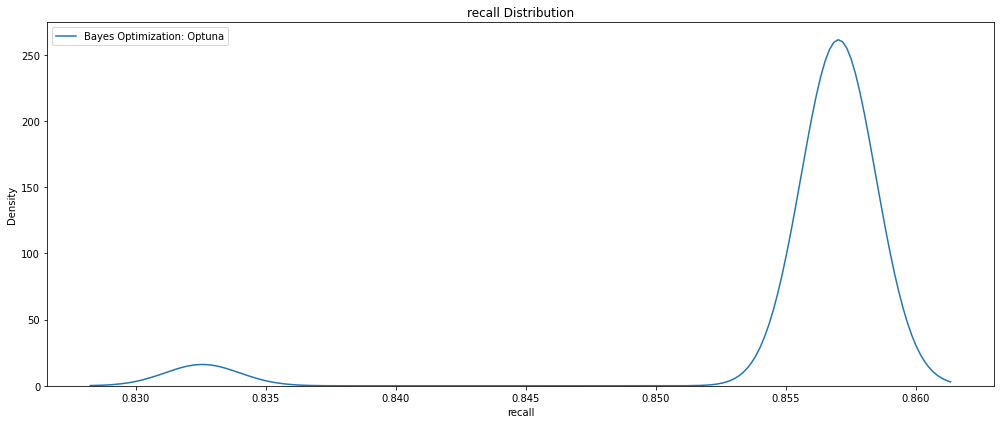

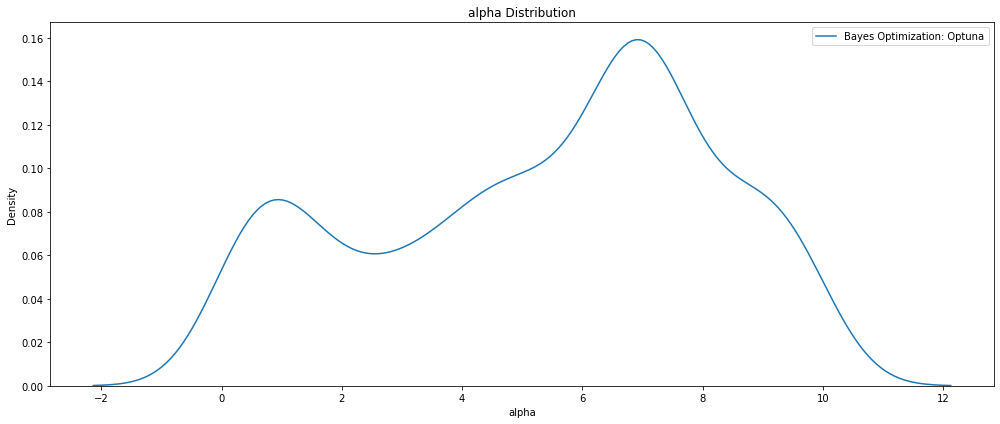

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','solver', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Ridge_Optuna_US_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 9.929872806400388, 'solver': 'svd'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Ridge(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Ridge_Optuna_US_trials1000_GPU_Recall.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Ridge_Optuna_US_trials1000_GPU_Recall.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Ridge HPO 1000 GPU Recall')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Ridge HPO 1000 GPU Recall


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    377848
           1       0.86      0.86      0.86     54625

    accuracy                           0.96    432473
   macro avg       0.92      0.92      0.92    432473
weighted avg       0.96      0.96      0.96    432473



Confusion matrix:
[[370492   7356]
 [  7810  46815]]


Accuracy score : 0.965
Precision score : 0.864
Recall score : 0.857
F1 score : 0.861


In [ ]:
# Evaluate on the testing data 
print('The best model from Ridge HPO 1000 GPU Recall trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Ridge HPO 1000 GPU Recall trials optimization scores 0.91878 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                     0
recall                                 0.832568
datetime_start       2022-06-12 15:52:11.337536
datetime_complete    2022-06-12 15:52:11.778718
duration                 0 days 00:00:00.441182
alpha                                  5.889669
solver                                      eig
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
################################################################################
######################        Precision Score     ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_ridge_optuna_US_1000_Precision_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, solver='eig', 
                   fit_intercept=True, normalize=False, verbose=0, handle=None):
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Precision score of the fitted model
    '''

    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')


    model = Ridge(alpha=alpha, solver=solver, 
                  fit_intercept=fit_intercept, 
                  normalize=normalize, 
                  verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = precision_score(y_test.to_numpy(), cupy.asnumpy(y_pred))
     
    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial Precision score:', score)
    print('######################################################')

    return score

In [ ]:
# With fit_intercept=False, normalize=True
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.3134954930010281
- Trial Precision score: 0.6200864431506756
######################################################
Score with default parameters :  0.6200864431506756


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):

    joblib.dump(study, 'Ridge_Optuna_US_1000_GPU_Precision.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 0, 10) 
    solver = trial.suggest_categorical('solver', ['eig', 'svd'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, solver=solver, 
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Ridge_Optuna_US_1000_GPU_Precision.pkl'): 
        study = joblib.load('Ridge_Optuna_US_1000_GPU_Precision.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)


# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest Precision score', study.best_value)

Start Time           2022-06-12 16:27:06.574332
- Trial time: 0.3055491739996796
- Trial Precision score: 0.6200864431506756
######################################################
- Trial time: 0.6508697540011781
- Trial Precision score: 0.8642077864540068
######################################################
- Trial time: 0.29387967200091225
- Trial Precision score: 0.6200864431506756
######################################################
- Trial time: 0.6505457929997647
- Trial Precision score: 0.8642077864540068
######################################################
- Trial time: 0.6534800040008122
- Trial Precision score: 0.8642077864540068
######################################################
- Trial time: 0.6525674250005977
- Trial Precision score: 0.8642077864540068
######################################################
- Trial time: 0.2976343820009788
- Trial Precision score: 0.6201033528312949
######################################################
- Trial time: 0.65081840899

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'precision'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_solver':'solver'}, inplace=True)

trials_df = trials_df.sort_values('precision', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Ridge_Optuna_US_1000_GPU_Precision.csv', index=False)

     iteration  precision             datetime_start  \
0            0   0.620086 2022-06-12 16:27:06.607772   
37          37   0.620086 2022-06-12 16:27:34.008057   
967        967   0.620086 2022-06-12 16:41:30.188165   
363        363   0.620086 2022-06-12 16:32:06.216873   
404        404   0.620086 2022-06-12 16:32:42.086129   
..         ...        ...                        ...   
351        351   0.864208 2022-06-12 16:31:55.580479   
352        352   0.864208 2022-06-12 16:31:56.466167   
353        353   0.864208 2022-06-12 16:31:57.353392   
323        323   0.864208 2022-06-12 16:31:31.613567   
999        999   0.864208 2022-06-12 16:42:02.171294   

             datetime_complete               duration     alpha solver  \
0   2022-06-12 16:27:07.036732 0 days 00:00:00.428960  2.238222    eig   
37  2022-06-12 16:27:34.469743 0 days 00:00:00.461686  3.333474    eig   
967 2022-06-12 16:41:30.845539 0 days 00:00:00.657374  4.266886    eig   
363 2022-06-12 16:32:06.750368 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'solver'])
py.plot(fig, filename='contour_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

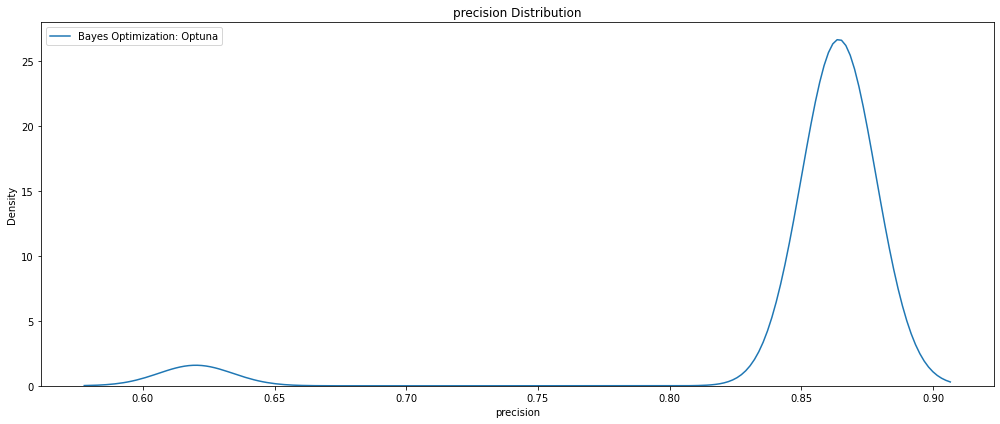

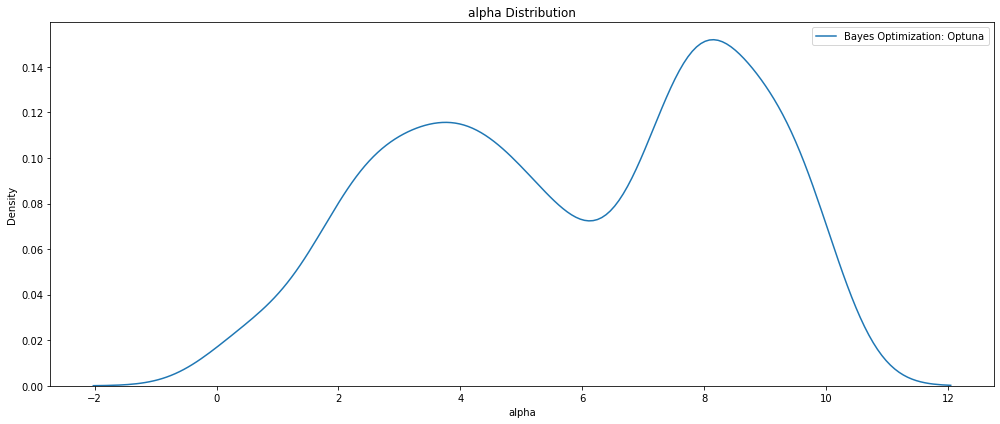

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','solver', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Ridge_Optuna_US_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 6.817916466067877, 'solver': 'svd'}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Ridge(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Ridge_Optuna_US_trials1000_GPU_Precision.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Ridge_Optuna_US_trials1000_GPU_Precision.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Ridge HPO 1000 GPU Precision')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Ridge HPO 1000 GPU Precision


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98    377848
           1       0.86      0.86      0.86     54625

    accuracy                           0.96    432473
   macro avg       0.92      0.92      0.92    432473
weighted avg       0.96      0.96      0.96    432473



Confusion matrix:
[[370492   7356]
 [  7810  46815]]


Accuracy score : 0.965
Precision score : 0.864
Recall score : 0.857
F1 score : 0.861


In [ ]:
# Evaluate on the testing data 
print('The best model from Ridge HPO 1000 GPU Precision trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Ridge HPO 1000 GPU Precision trials optimization scores 0.91878 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                     0
precision                              0.620086
datetime_start       2022-06-12 16:27:06.607772
datetime_complete    2022-06-12 16:27:07.036732
duration                 0 days 00:00:00.428960
alpha                                  2.238222
solver                                      eig
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
################################################################################
######################  Lending Tree Loan Status  ##############################
######################   Classification - Linear  ##############################
######################       Lasso HPO GPU        ##############################
################################################################################

In [ ]:
################################################################################
######################         F1 Weighted        ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_lasso_optuna_US_1000_weightedF1_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, 
                   max_iter=1e6, tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Weighted F1 of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = Lasso(alpha=alpha, max_iter=max_iter, tol=tol, 
                  selection=selection, fit_intercept=fit_intercept, 
                  normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = f1_score(y_test.to_numpy(), cupy.asnumpy(y_pred), average='weighted') 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted F1:', score)
    print('######################################################')

    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 1.047287048999351
- Trial weighted F1: 0.9795116141738527
######################################################
Score with default parameters :  0.9795116141738527


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Lasso_Optuna_US_1000_GPU_weightedF1.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, max_iter=max_iter, 
                           tol=tol, selection=selection,
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Lasso_Optuna_1000_GPU_weightedF1.pkl'): 
        study = joblib.load('Lasso_Optuna_1000_GPU_weightedF1.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest F1 score', study.best_value)

Start Time           2022-06-12 16:54:54.033548
- Trial time: 0.533692687000439
- Trial weighted F1: 0.9796977633036887
######################################################
- Trial time: 0.38470874900122
- Trial weighted F1: 0.9805523518357939
######################################################
- Trial time: 0.37143678899883525
- Trial weighted F1: 0.9803341268348064
######################################################
- Trial time: 0.3725922070007073
- Trial weighted F1: 0.9807192737081539
######################################################
- Trial time: 0.5475215749993367
- Trial weighted F1: 0.9798310965763294
######################################################
- Trial time: 0.5883198699993955
- Trial weighted F1: 0.9798262182680344
######################################################
- Trial time: 0.36594999599947187
- Trial weighted F1: 0.9791386133716459
######################################################
- Trial time: 0.5726893640003254
- Trial weighted F1: 0.9

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'f1_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

  
trials_df = trials_df.sort_values('f1_weighted', ascending=False)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Lasso_Optuna_1000_GPU_weightedF1.csv', index=False)

     iteration  f1_weighted             datetime_start  \
946        946     0.981779 2022-06-12 17:05:13.253082   
999        999     0.981774 2022-06-12 17:05:58.600381   
982        982     0.981774 2022-06-12 17:05:43.601777   
964        964     0.981772 2022-06-12 17:05:28.768528   
912        912     0.981772 2022-06-12 17:04:44.929860   
..         ...          ...                        ...   
998        998     0.950750 2022-06-12 17:05:57.855077   
903        903     0.949830 2022-06-12 17:04:37.847775   
942        942     0.949312 2022-06-12 17:05:10.085204   
924        924     0.948594 2022-06-12 17:04:54.639738   
960        960     0.948308 2022-06-12 17:05:25.262758   

             datetime_complete               duration     alpha  max_iter  \
946 2022-06-12 17:05:14.019029 0 days 00:00:00.765947  0.601235   4747176   
999 2022-06-12 17:05:59.388202 0 days 00:00:00.787821  0.596950   4929519   
982 2022-06-12 17:05:44.390236 0 days 00:00:00.788459  0.598962   448192

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'max_iter', 'tol'])
py.plot(fig, filename='contour_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

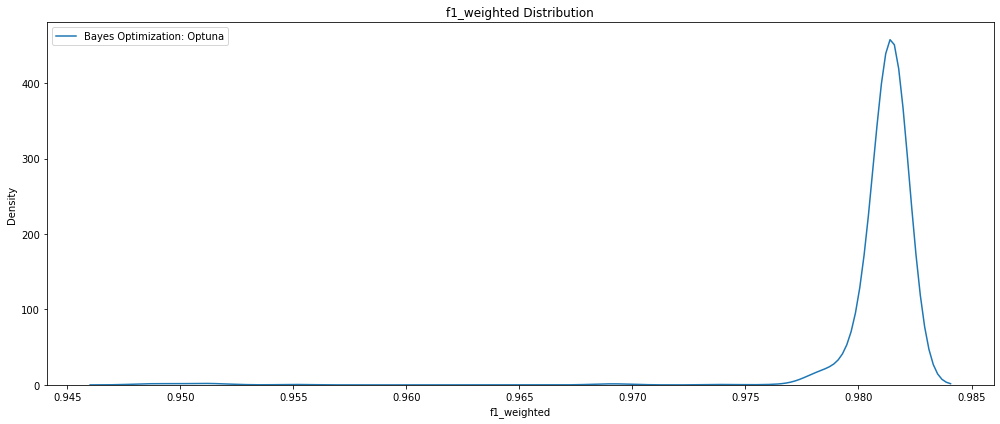

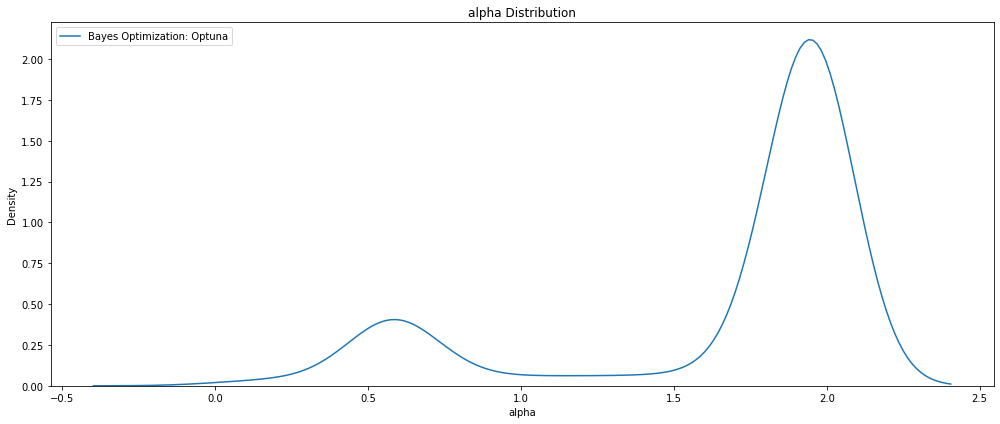

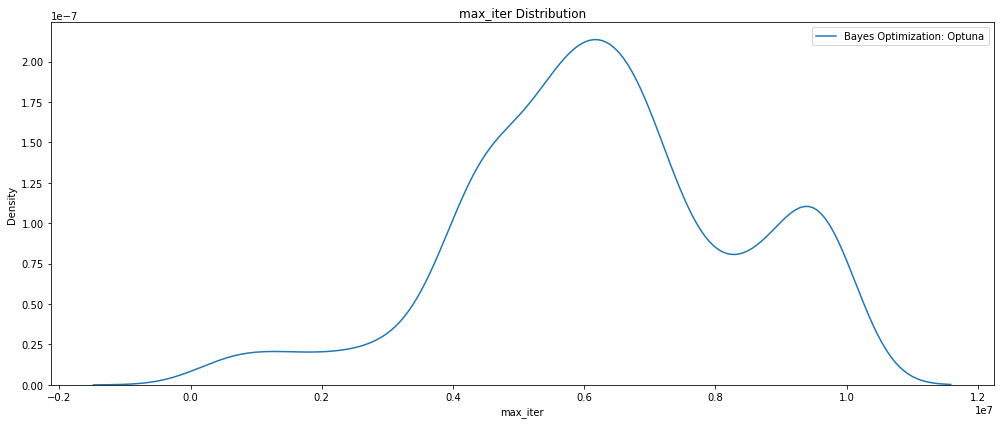

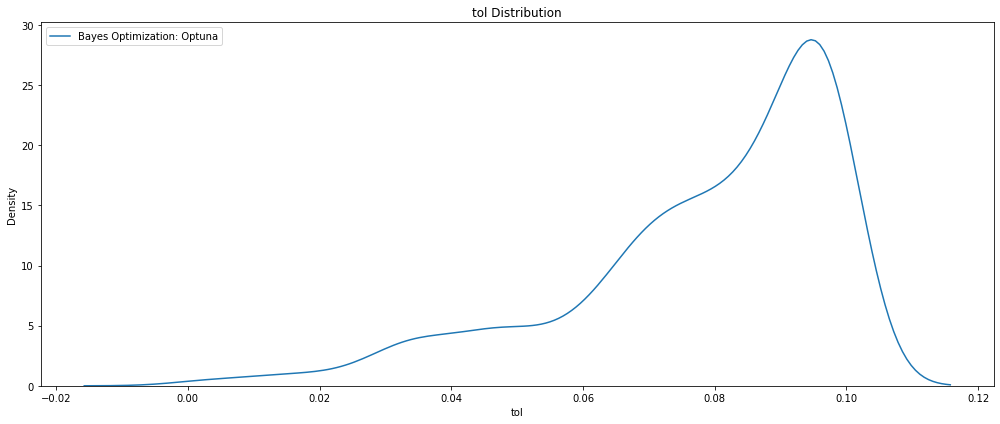

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize', 'selection',
                   'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

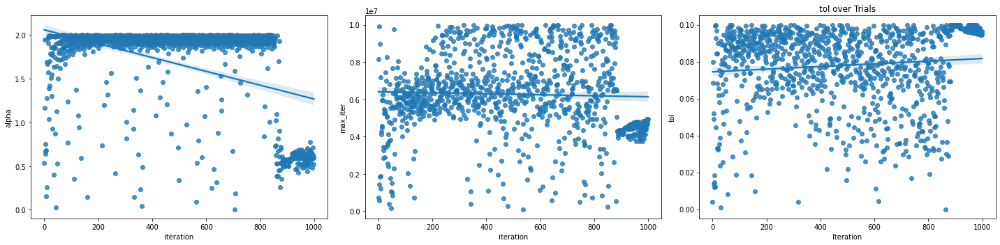

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 3, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Lasso_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 0.6012354699405421,
 'max_iter': 4747176,
 'selection': 'random',
 'tol': 0.09994179786230611}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Lasso(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Lasso_Optuna_trials1000_GPU_F1weighted.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Lasso_Optuna_trials1000_GPU_F1weighted.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Lasso HPO 1000 F1weighted GPU trials')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Lasso HPO 1000 F1weighted GPU trials


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       1.00      0.86      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.99      0.93      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[377829     19]
 [  7614  47011]]


Accuracy score : 0.982
Precision score : 1.000
Recall score : 0.861
F1 score : 0.925


In [ ]:
# Evaluate on the testing data 
print('The best model from Lasso HPO 1000 F1weighted GPU Precision trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Lasso HPO 1000 F1weighted GPU Precision trials optimization scores 0.93028 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   946
f1_weighted                            0.981779
datetime_start       2022-06-12 17:05:13.253082
datetime_complete    2022-06-12 17:05:14.019029
duration                 0 days 00:00:00.765947
alpha                                  0.601235
max_iter                                4747176
selection                                random
tol                                    0.099942
state                                  COMPLETE
Name: 946, dtype: object


In [ ]:
################################################################################
######################         ROC Weighted       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_lasso_optuna_US_1000_weightedROC_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, 
                   max_iter=1e6, tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Weighted ROC of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = Lasso(alpha=alpha, max_iter=max_iter, tol=tol, 
                  selection=selection, fit_intercept=fit_intercept, 
                  normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_pred), average='weighted') 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted ROC:', score)
    print('######################################################')

    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.9751806749991374
- Trial weighted ROC: 0.9217914037763759
######################################################
Score with default parameters :  0.9217914037763759


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Lasso_Optuna_US_1000_GPU_ROCweighted.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, max_iter=max_iter, 
                           tol=tol, selection=selection,
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Lasso_Optuna_1000_GPU_ROCweighted.pkl'): 
        study = joblib.load('Lasso_Optuna_1000_GPU_ROCweighted.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest ROCweighted score', study.best_value)

Start Time           2022-06-12 18:13:52.085693
- Trial time: 0.45587723899916455
- Trial weighted ROC: 0.9217378071513459
######################################################
- Trial time: 0.2500463659998786
- Trial weighted ROC: 0.917042014109823
######################################################
- Trial time: 0.3942925079991255
- Trial weighted ROC: 0.9251301202226924
######################################################
- Trial time: 0.31324423600017326
- Trial weighted ROC: 0.9257948252967897
######################################################
- Trial time: 0.37723255200035055
- Trial weighted ROC: 0.9233854044053506
######################################################
- Trial time: 0.4735645029995794
- Trial weighted ROC: 0.9227745593290526
######################################################
- Trial time: 0.33372126299946103
- Trial weighted ROC: 0.9252484921109537
######################################################
- Trial time: 0.3982511659996817
- Trial weigh

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'roc_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('roc_weighted', ascending=False)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Lasso_Optuna_1000_GPU_ROCweighted.csv', index=False)

     iteration  roc_weighted             datetime_start  \
897        897      0.931747 2022-06-12 18:23:04.815688   
586        586      0.931746 2022-06-12 18:19:27.734491   
519        519      0.931746 2022-06-12 18:18:44.476119   
400        400      0.931746 2022-06-12 18:17:29.687382   
274        274      0.931746 2022-06-12 18:16:16.339719   
..         ...           ...                        ...   
130        130      0.910298 2022-06-12 18:14:59.988324   
677        677      0.910231 2022-06-12 18:20:25.942876   
822        822      0.909904 2022-06-12 18:22:06.084684   
18          18      0.909692 2022-06-12 18:14:01.728588   
420        420      0.908849 2022-06-12 18:17:42.259019   

             datetime_complete               duration     alpha  max_iter  \
897 2022-06-12 18:23:05.551669 0 days 00:00:00.735981  0.238002   1235901   
586 2022-06-12 18:19:28.355464 0 days 00:00:00.620973  0.236648   2537613   
519 2022-06-12 18:18:45.086589 0 days 00:00:00.610470  0.236

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'max_iter', 'tol'])
py.plot(fig, filename='contour_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

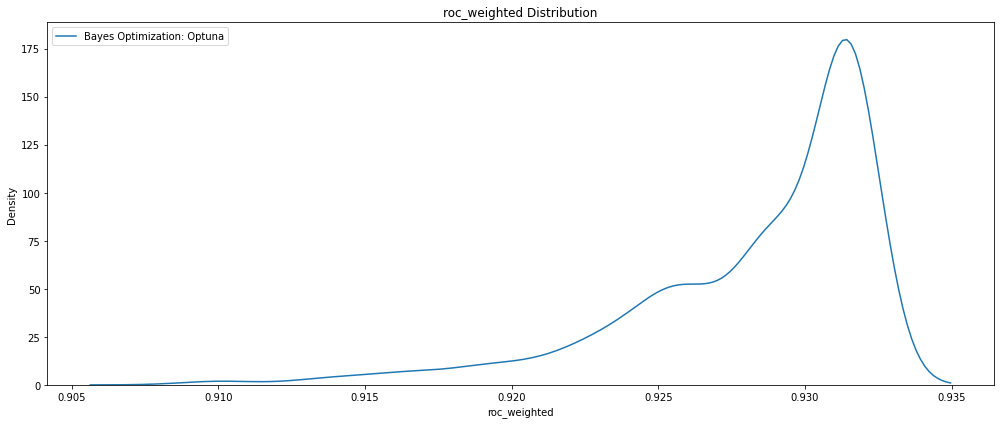

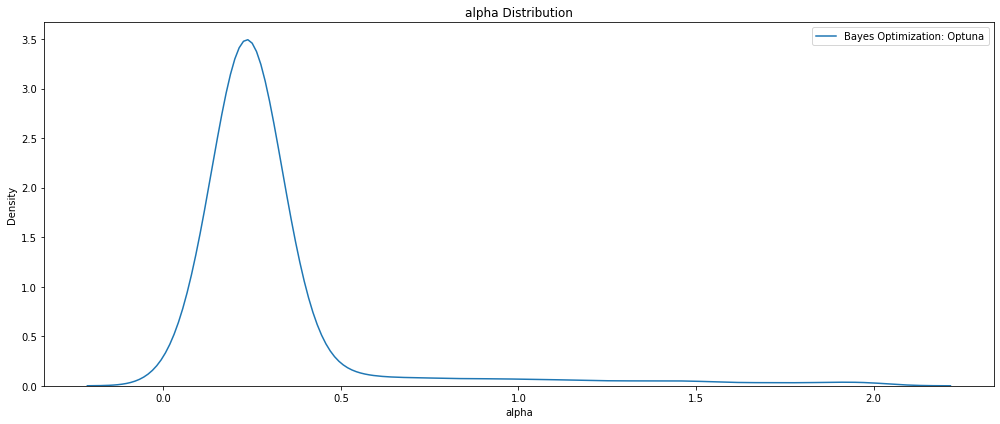

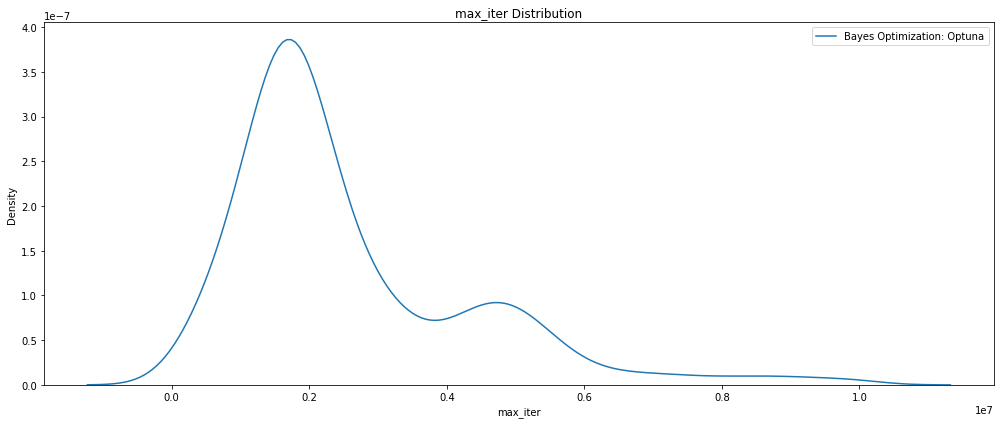

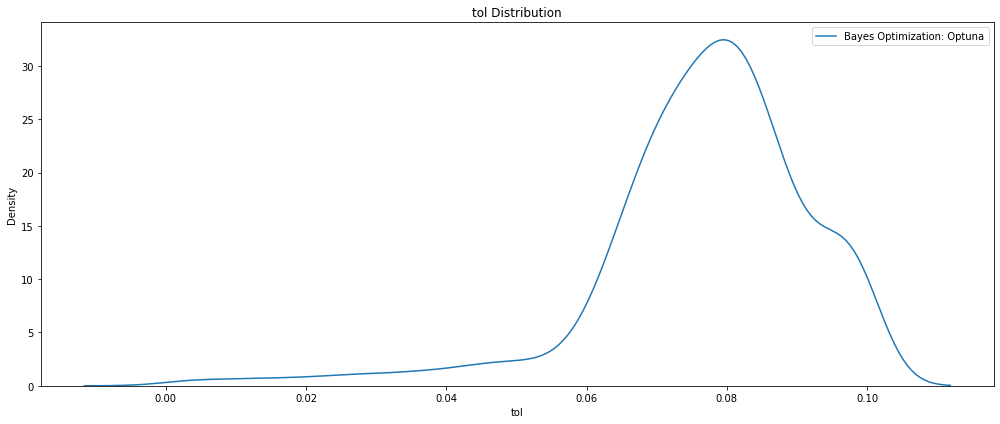

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize', 'selection',
                   'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

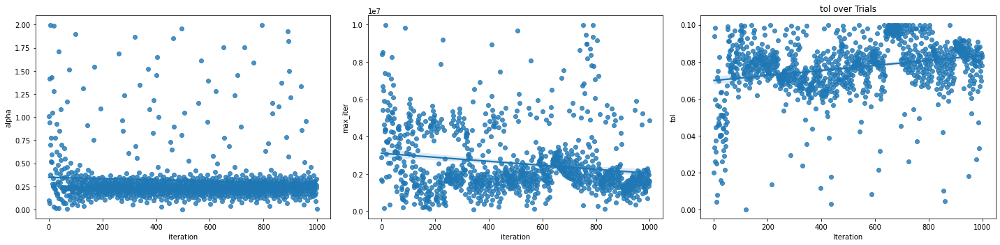

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 3, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Lasso_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 0.23800232755492842,
 'max_iter': 1235901,
 'selection': 'random',
 'tol': 0.08698627763234176}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Lasso(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Lasso_Optuna_trials1000_GPU_ROCweighted.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Lasso_Optuna_trials1000_GPU_ROCweighted.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Lasso HPO 1000 ROCweighted GPU trials')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Lasso HPO 1000 ROCweighted GPU trials


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       0.98      0.87      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.98      0.93      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[377062    786]
 [  7343  47282]]


Accuracy score : 0.981
Precision score : 0.984
Recall score : 0.866
F1 score : 0.921


In [ ]:
# Evaluate on the testing data 
print('The best model from Lasso HPO 1000 ROC weighted GPU Precision trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Lasso HPO 1000 ROC weighted GPU Precision trials optimization scores 0.93175 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   897
roc_weighted                           0.931747
datetime_start       2022-06-12 18:23:04.815688
datetime_complete    2022-06-12 18:23:05.551669
duration                 0 days 00:00:00.735981
alpha                                  0.238002
max_iter                                1235901
selection                                random
tol                                    0.086986
state                                  COMPLETE
Name: 897, dtype: object


In [ ]:
################################################################################
######################         Recall Score       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_lasso_optuna_US_1000_Recall_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, 
                   max_iter=1e6, tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Recall of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = Lasso(alpha=alpha, max_iter=max_iter, tol=tol, 
                  selection=selection, fit_intercept=fit_intercept, 
                  normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = recall_score(y_test.to_numpy(), cupy.asnumpy(y_pred)) 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial Recall score:', score)
    print('######################################################')

    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 1.1068345769999723
- Trial Recall score: 0.8435881006864988
######################################################
Score with default parameters :  0.8435881006864988


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Lasso_Optuna_US_1000_GPU_Recall.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, max_iter=max_iter, 
                           tol=tol, selection=selection,
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Lasso_Optuna_1000_GPU_Recall.pkl'): 
        study = joblib.load('Lasso_Optuna_1000_GPU_Recall.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest Recall score', study.best_value)

Start Time           2022-06-12 18:27:45.295169
- Trial time: 0.7285292660017149
- Trial Recall score: 0.843441647597254
######################################################
- Trial time: 0.38698483500047587
- Trial Recall score: 0.8529794050343249
######################################################
- Trial time: 0.4881896700026118
- Trial Recall score: 0.8498489702517162
######################################################
- Trial time: 0.3835464600015257
- Trial Recall score: 0.8524485125858123
######################################################
- Trial time: 0.40144211200095015
- Trial Recall score: 0.8529610983981694
######################################################
- Trial time: 0.4851288050012954
- Trial Recall score: 0.8490617848970252
######################################################
- Trial time: 0.3742207609975594
- Trial Recall score: 0.859350114416476
######################################################
- Trial time: 0.3388190529985877
- Trial Recall s

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'recall'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('recall', ascending=False)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Lasso_Optuna_1000_GPU_Recall.csv', index=False)

     iteration    recall             datetime_start  \
738        738  0.888165 2022-06-12 18:35:37.362689   
184        184  0.888165 2022-06-12 18:29:28.863797   
619        619  0.888165 2022-06-12 18:34:07.654035   
131        131  0.888165 2022-06-12 18:28:56.995588   
707        707  0.888165 2022-06-12 18:35:13.469203   
..         ...       ...                        ...   
70          70  0.847030 2022-06-12 18:28:23.526573   
30          30  0.847011 2022-06-12 18:28:02.361549   
8            8  0.846499 2022-06-12 18:27:50.203836   
0            0  0.843442 2022-06-12 18:27:45.329684   
555        555  0.843350 2022-06-12 18:33:21.905942   

             datetime_complete               duration     alpha  max_iter  \
738 2022-06-12 18:35:38.050201 0 days 00:00:00.687512  0.328632   8825790   
184 2022-06-12 18:29:29.420458 0 days 00:00:00.556661  0.328839   9201266   
619 2022-06-12 18:34:08.351879 0 days 00:00:00.697844  0.328937   4101788   
131 2022-06-12 18:28:57.578520 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'max_iter', 'tol'])
py.plot(fig, filename='contour_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

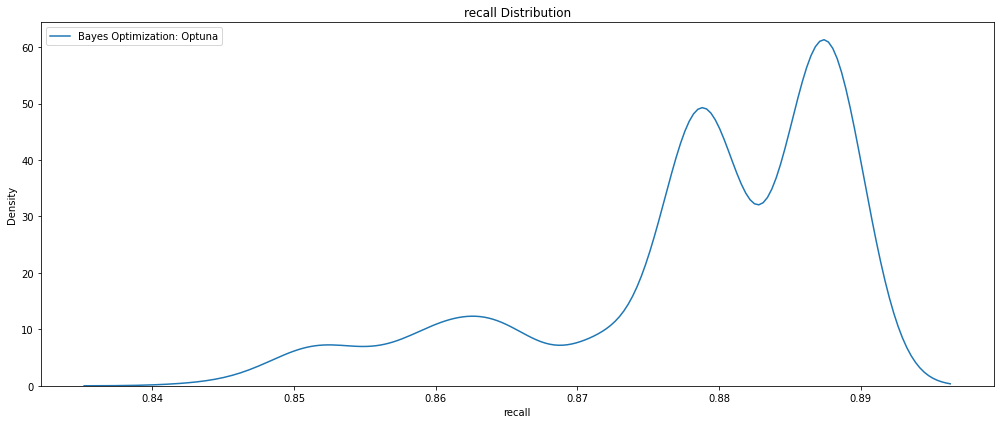

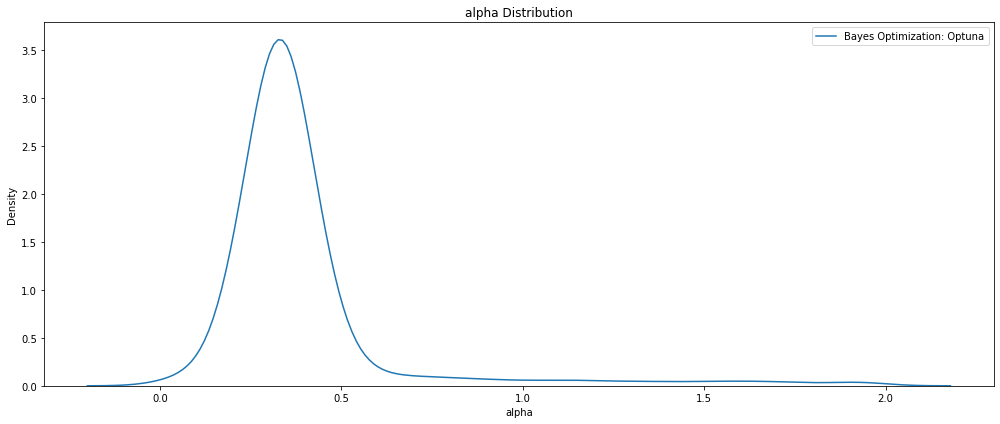

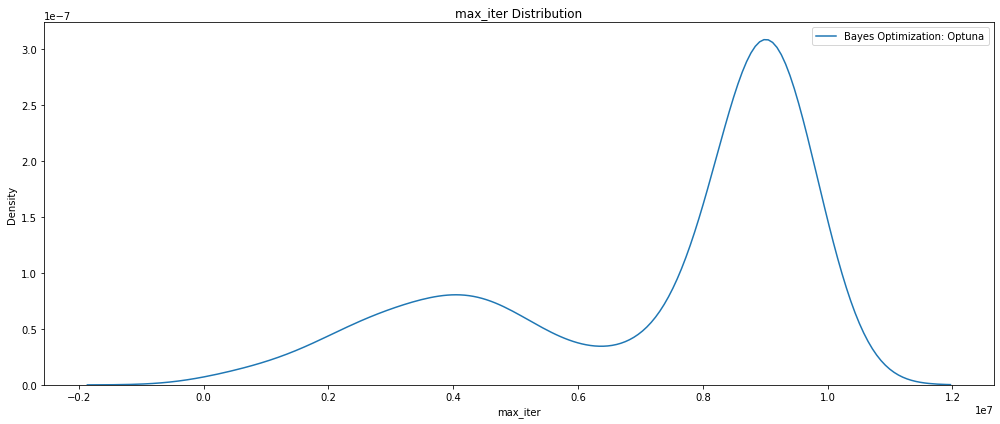

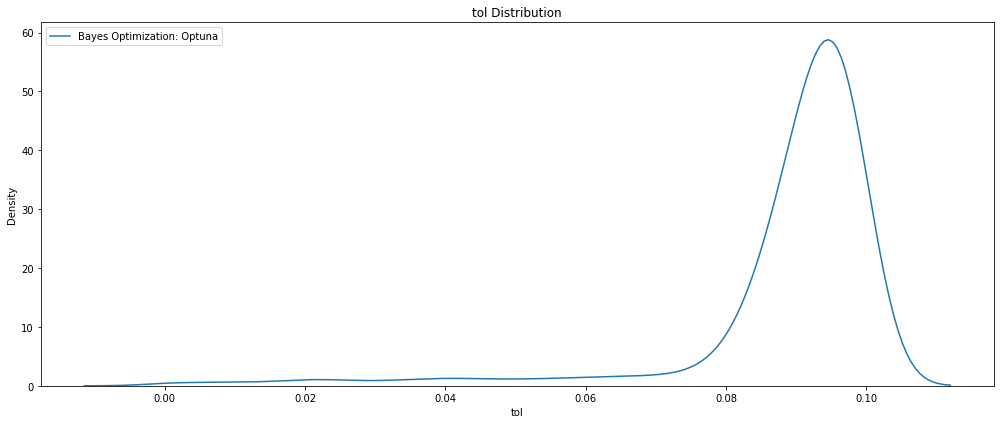

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize', 'selection',
                   'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

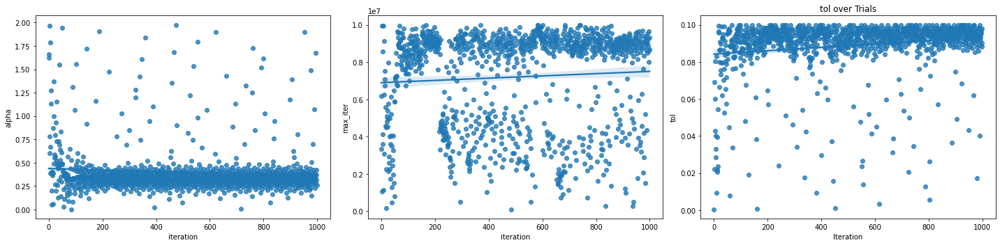

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 3, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Lasso_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 0.3285123703430289,
 'max_iter': 9023366,
 'selection': 'cyclic',
 'tol': 0.08844367745062308}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Lasso(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Lasso_Optuna_trials1000_GPU_Recall.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Lasso_Optuna_trials1000_GPU_Recall.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Lasso HPO 1000 Recall GPU trials')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Lasso HPO 1000 Recall GPU trials


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97    377848
           1       0.76      0.89      0.82     54625

    accuracy                           0.95    432473
   macro avg       0.87      0.92      0.89    432473
weighted avg       0.95      0.95      0.95    432473



Confusion matrix:
[[362150  15698]
 [  6109  48516]]


Accuracy score : 0.950
Precision score : 0.756
Recall score : 0.888
F1 score : 0.816


In [ ]:
# Evaluate on the testing data 
print('The best model from Lasso HPO 1000 Recall GPU Precision trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Lasso HPO 1000 Recall GPU Precision trials optimization scores 0.92331 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   738
recall                                 0.888165
datetime_start       2022-06-12 18:35:37.362689
datetime_complete    2022-06-12 18:35:38.050201
duration                 0 days 00:00:00.687512
alpha                                  0.328632
max_iter                                8825790
selection                                cyclic
tol                                    0.097534
state                                  COMPLETE
Name: 738, dtype: object


In [ ]:
################################################################################
######################        Precision Score     ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_lasso_optuna_US_1000_Precision_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0, 
                   max_iter=1e6, tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Precision of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = Lasso(alpha=alpha, max_iter=max_iter, tol=tol, 
                  selection=selection, fit_intercept=fit_intercept, 
                  normalize=normalize, verbose=verbose, handle=handle) 
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = precision_score(y_test.to_numpy(), cupy.asnumpy(y_pred)) 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial Precision score:', score)
    print('######################################################')

    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 1.0455727919979836
- Trial Precision score: 0.9999566000477399
######################################################
Score with default parameters :  0.9999566000477399


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Lasso_Optuna_US_1000_GPU_Precision.pkl')
    
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, max_iter=max_iter, 
                           tol=tol, selection=selection,
                           fit_intercept=True, 
                           normalize=False, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Lasso_Optuna_1000_GPU_Precision.pkl'): 
        study = joblib.load('Lasso_Optuna_1000_GPU_Precision.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest Precision score', study.best_value)

Start Time           2022-06-12 18:41:30.463947
- Trial time: 0.35742856999786454
- Trial Precision score: 0.9606951437388338
######################################################
- Trial time: 0.591697136998846
- Trial Precision score: 0.999891777234259
######################################################
- Trial time: 0.36833861799823353
- Trial Precision score: 0.9952500639004856
######################################################
- Trial time: 0.3247410329968261
- Trial Precision score: 0.868845339558113
######################################################
- Trial time: 0.918922280001425
- Trial Precision score: 0.99997830002387
######################################################
- Trial time: 0.4046876969987352
- Trial Precision score: 0.9998491184204854
######################################################
- Trial time: 0.33838355300031253
- Trial Precision score: 0.9982962410818869
######################################################
- Trial time: 0.466161750999162

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'precision'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('precision', ascending=False)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Lasso_Optuna_1000_GPU_Precision.csv', index=False)

     iteration  precision             datetime_start  \
500        500   0.999979 2022-06-12 18:47:15.046404   
469        469   0.999979 2022-06-12 18:46:50.680297   
770        770   0.999979 2022-06-12 18:50:50.857585   
225        225   0.999979 2022-06-12 18:43:53.691347   
484        484   0.999979 2022-06-12 18:47:03.018241   
..         ...        ...                        ...   
35          35   0.950740 2022-06-12 18:41:53.263025   
26          26   0.896159 2022-06-12 18:41:47.926950   
290        290   0.886759 2022-06-12 18:44:38.794945   
730        730   0.870487 2022-06-12 18:50:18.330600   
3            3   0.868845 2022-06-12 18:41:32.258036   

             datetime_complete               duration     alpha  max_iter  \
500 2022-06-12 18:47:15.716000 0 days 00:00:00.669596  1.999537   8207989   
469 2022-06-12 18:46:51.376471 0 days 00:00:00.696174  1.998858   8279071   
770 2022-06-12 18:50:51.606825 0 days 00:00:00.749240  1.999727   8226233   
225 2022-06-12 18:4

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'max_iter', 'tol'])
py.plot(fig, filename='contour_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

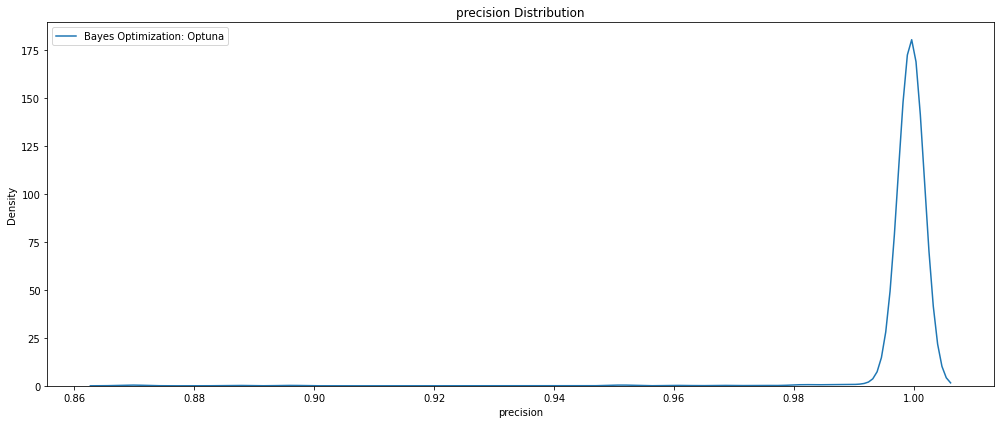

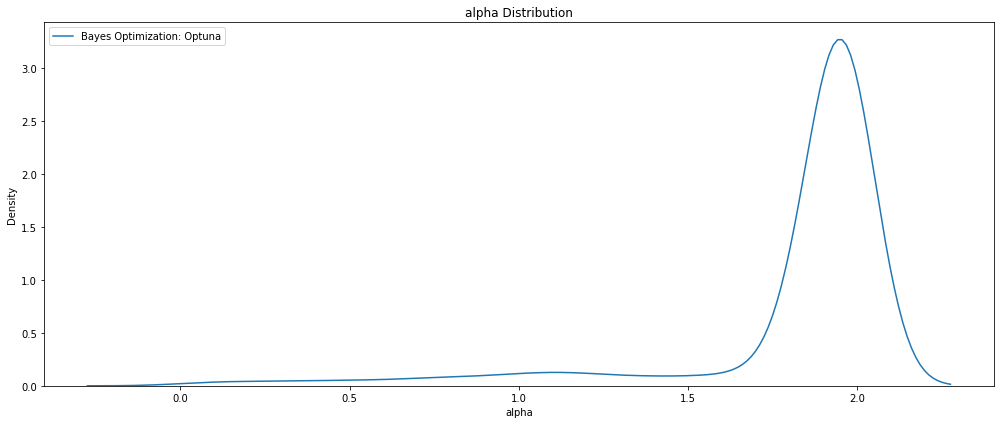

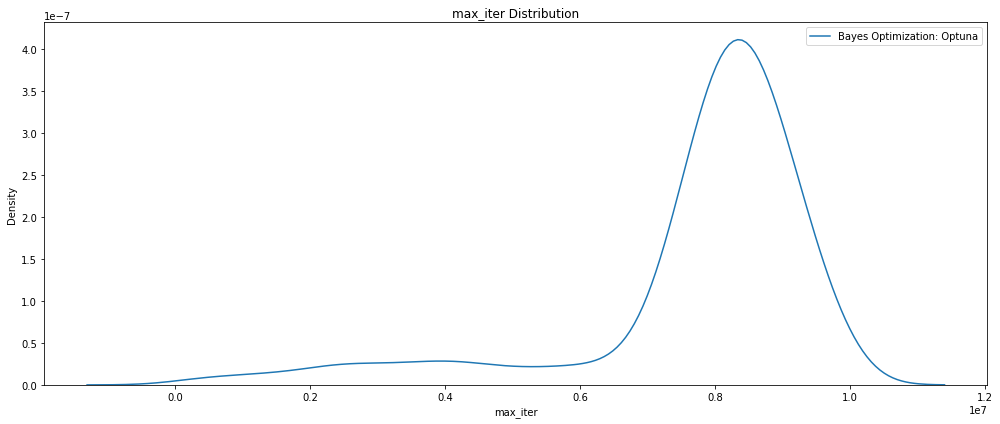

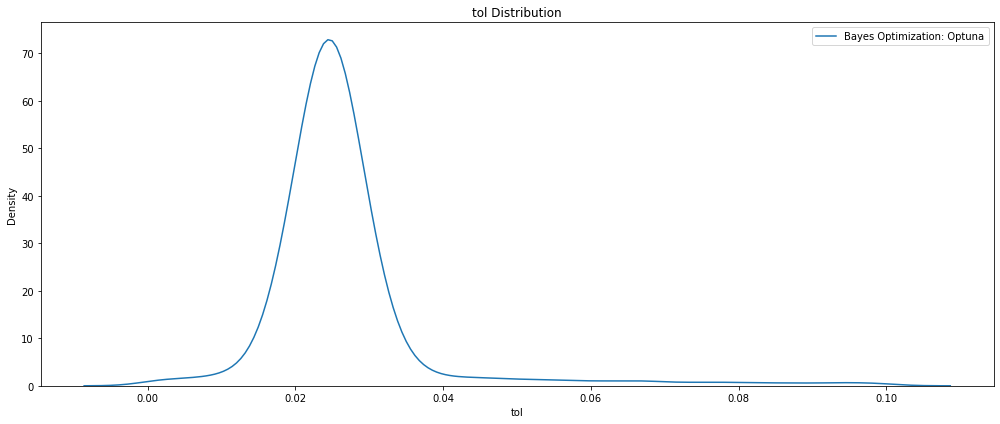

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize', 'selection',
                   'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

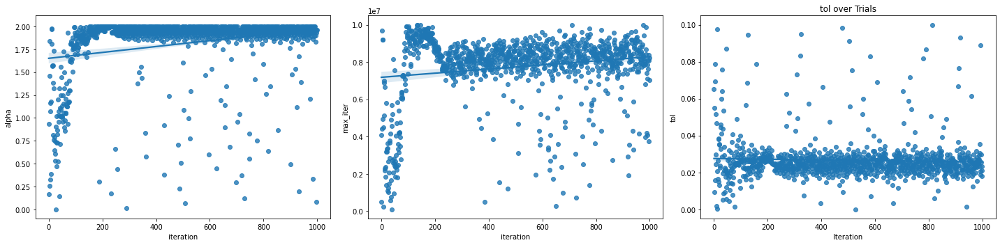

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 3, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Lasso_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 1.9987728599988823,
 'max_iter': 9477704,
 'selection': 'random',
 'tol': 0.027123652616022658}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = Lasso(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Lasso_Optuna_trials1000_GPU_Precision.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Lasso_Optuna_trials1000_GPU_Precision.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Lasso HPO 1000 Precision GPU trials')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Lasso HPO 1000 Precision GPU trials


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       1.00      0.85      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.99      0.93      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[377847      1]
 [  8017  46608]]


Accuracy score : 0.981
Precision score : 1.000
Recall score : 0.853
F1 score : 0.921


In [ ]:
# Evaluate on the testing data 
print('The best model from Lasso HPO 1000 Precision GPU trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Lasso HPO 1000 Precision GPU trials optimization scores 0.92662 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   500
precision                              0.999979
datetime_start       2022-06-12 18:47:15.046404
datetime_complete    2022-06-12 18:47:15.716000
duration                 0 days 00:00:00.669596
alpha                                  1.999537
max_iter                                8207989
selection                                random
tol                                    0.025713
state                                  COMPLETE
Name: 500, dtype: object


In [ ]:
################################################################################
######################  Lending Tree Loan Status  ##############################
######################   Classification - Linear  ##############################
######################     Elastic Net HPO GPU    ##############################
################################################################################

In [ ]:
################################################################################
######################         F1 Weighted        ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_elnet_optuna_US_1000_weightedF1_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0,
                   l1_ratio=0.5, max_iter=1e6, 
                   tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: F1 weighted of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                       max_iter=max_iter, tol=tol, 
                       selection=selection, fit_intercept=fit_intercept, 
                       normalize=normalize, verbose=verbose, handle=handle)  
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = f1_score(y_test.to_numpy(), cupy.asnumpy(y_pred), average='weighted') 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted F1:', score)
    print('######################################################')
    
    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.7718900449981447
- Trial weighted F1: 0.9797157500197717
######################################################
Score with default parameters :  0.9797157500197717


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Elnet_Optuna_1000_GPU_F1weighted.pkl')
     
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    l1_ratio = trial.suggest_float('l1_ratio', 0, 1)
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    normalize = trial.suggest_categorical('normalize', [True, False])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, l1_ratio=l1_ratio,
                           max_iter=max_iter, tol=tol, 
                           selection=selection,
                           fit_intercept=fit_intercept, 
                           normalize=normalize, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Elnet_Optuna_1000_GPU_F1weighted.pkl'): 
        study = joblib.load('Elnet_Optuna_1000_GPU_F1weighted.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest F1 weighted score:', study.best_value)

Start Time           2022-06-12 18:55:44.767880
- Trial time: 0.2730501810001442
- Trial weighted F1: 0.8147946302801139
######################################################
- Trial time: 0.26877036900259554
- Trial weighted F1: 0.8147946302801139
######################################################
- Trial time: 0.2748871420008072
- Trial weighted F1: 0.8147946302801139
######################################################
- Trial time: 0.7612694959971122
- Trial weighted F1: 0.9556023082810027
######################################################
- Trial time: 0.3045662350014027
- Trial weighted F1: 0.901108202544403
######################################################
- Trial time: 0.38529997899968293
- Trial weighted F1: 0.9805110762023488
######################################################
- Trial time: 0.3358128489999217
- Trial weighted F1: 0.9812040219324532
######################################################
- Trial time: 0.2725964550008939
- Trial weighted F1: 0

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'f1_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_l1_ratio':'l1_ratio'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('f1_weighted', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Elnet_Optuna_1000_GPU_weightedF1.csv', index=False)

     iteration  f1_weighted             datetime_start  \
0            0     0.814795 2022-06-12 18:55:44.770930   
88          88     0.814795 2022-06-12 18:56:33.146907   
660        660     0.814795 2022-06-12 19:03:02.347073   
641        641     0.814795 2022-06-12 19:02:46.687312   
974        974     0.814795 2022-06-12 19:07:32.889801   
..         ...          ...                        ...   
957        957     0.981488 2022-06-12 19:07:17.254768   
388        388     0.981488 2022-06-12 18:59:40.747185   
758        758     0.981488 2022-06-12 19:04:22.372015   
176        176     0.981488 2022-06-12 18:57:24.577530   
999        999          NaN 2022-06-12 19:07:55.983235   

             datetime_complete               duration     alpha fit_intercept  \
0   2022-06-12 18:55:45.173255 0 days 00:00:00.402325  0.120439          True   
88  2022-06-12 18:56:33.613735 0 days 00:00:00.466828  1.731458          True   
660 2022-06-12 19:03:03.013318 0 days 00:00:00.666245  1.891

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'l1_ratio', 
                                                       'max_iter', 'tol'])
py.plot(fig, filename='contour_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

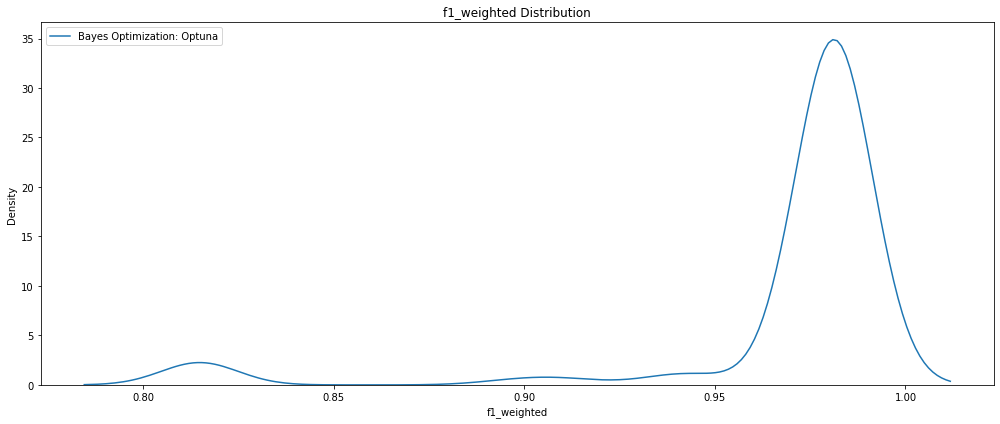

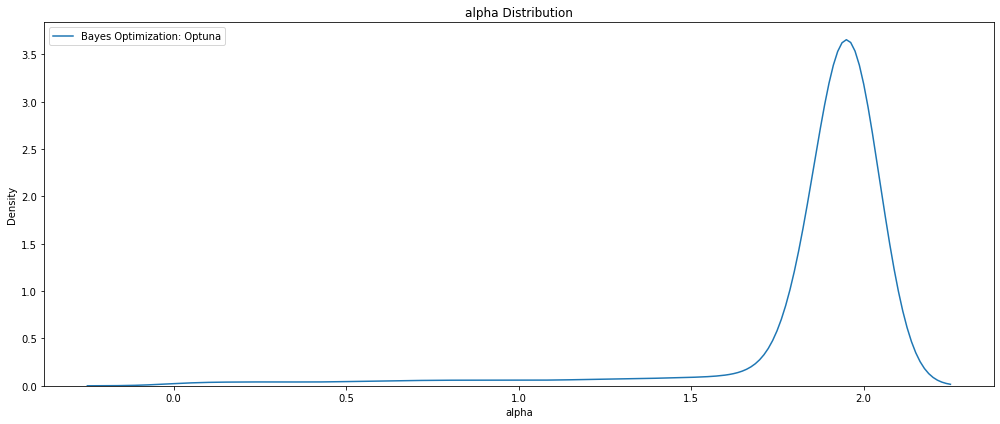

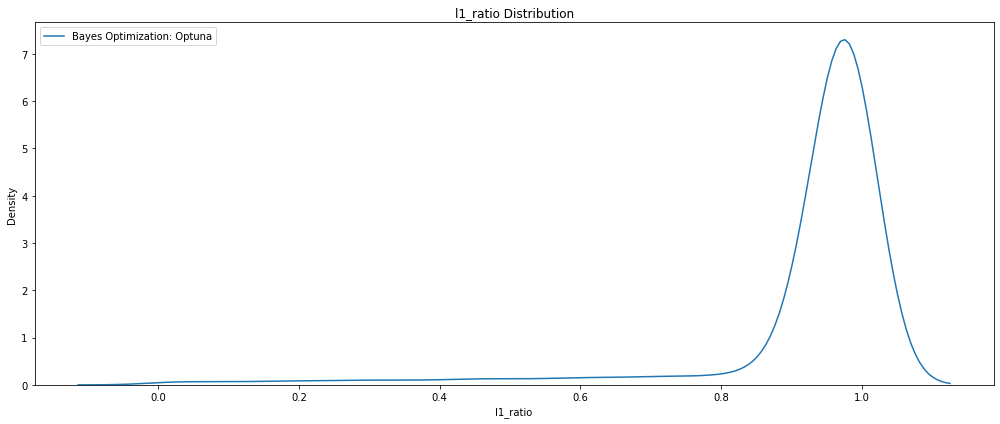

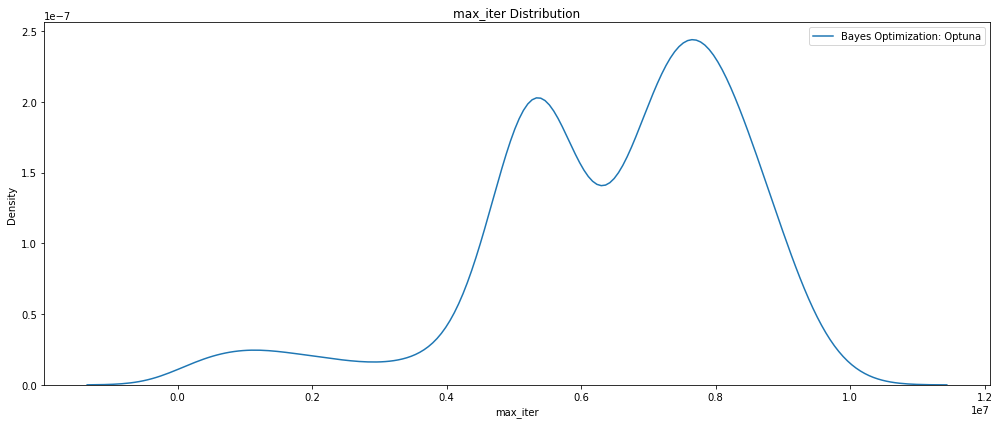

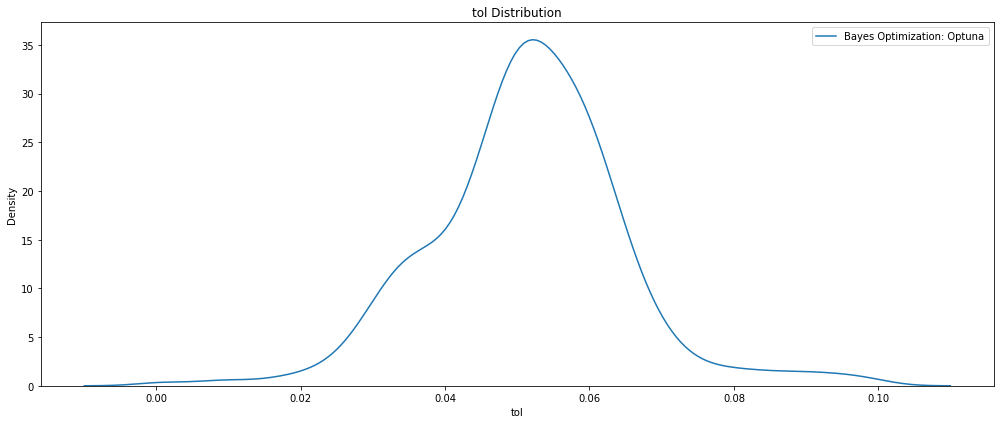

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize',
                   'selection', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

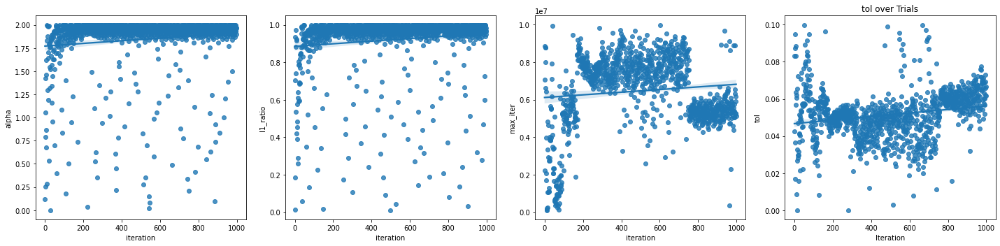

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'l1_ratio', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Elnet_Optuna_1000_GPU_weightedF1.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 1.999861306067746,
 'fit_intercept': True,
 'l1_ratio': 0.9998625972496201,
 'max_iter': 5248929,
 'normalize': False,
 'selection': 'random',
 'tol': 0.05853628308252576}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
# Set up features and target
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = ElasticNet(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Elnet_Optuna_trials1000_GPU_F1weighted.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Elnet_Optuna_trials1000_GPU_F1weighted.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Elastic Net HPO 1000 GPU F1 weighted')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))



Model Metrics for Elastic Net HPO 1000 GPU F1 weighted


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       1.00      0.86      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.99      0.93      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[377778     70]
 [  7684  46941]]


Accuracy score : 0.982
Precision score : 0.999
Recall score : 0.859
F1 score : 0.924


In [ ]:
# Evaluate on the testing data 
print('The best model from Elastic Net HPO 1000 F1 weighted GPU trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Elastic Net HPO 1000 F1 weighted GPU trials optimization scores 0.92957 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                     0
f1_weighted                            0.814795
datetime_start       2022-06-12 18:55:44.770930
datetime_complete    2022-06-12 18:55:45.173255
duration                 0 days 00:00:00.402325
alpha                                  0.120439
fit_intercept                              True
l1_ratio                               0.184574
max_iter                              8855812.0
normalize                                  True
selection                                random
tol                                     0.04243
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
################################################################################
######################         ROC Weighted       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_elnet_optuna_US_1000_weightedROC_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0,
                   l1_ratio=0.5, max_iter=1e6, 
                   tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: ROC weighted of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                       max_iter=max_iter, tol=tol, 
                       selection=selection, fit_intercept=fit_intercept, 
                       normalize=normalize, verbose=verbose, handle=handle)  
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_pred), average='weighted') 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial weighted ROC:', score)
    print('######################################################')
    
    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.6991569779966085
- Trial weighted ROC: 0.9230208215893192
######################################################
Score with default parameters :  0.9230208215893192


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Elnet_Optuna_1000_GPU_ROCweighted.pkl')
     
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    l1_ratio = trial.suggest_float('l1_ratio', 0, 1)
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    normalize = trial.suggest_categorical('normalize', [True, False])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, l1_ratio=l1_ratio,
                           max_iter=max_iter, tol=tol, 
                           selection=selection,
                           fit_intercept=fit_intercept, 
                           normalize=normalize, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Elnet_Optuna_1000_GPU_ROCweighted.pkl'): 
        study = joblib.load('Elnet_Optuna_1000_GPU_ROCweighted.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest ROC weighted score:', study.best_value)

Start Time           2022-06-12 21:08:08.997589
- Trial time: 0.26871758500055876
- Trial weighted ROC: 0.9315012822707346
######################################################
- Trial time: 0.2862787680023757
- Trial weighted ROC: 0.9316604058624763
######################################################
- Trial time: 0.25582971300173085
- Trial weighted ROC: 0.9261456187847769
######################################################
- Trial time: 0.28213653799684835
- Trial weighted ROC: 0.9316460690766308
######################################################
- Trial time: 0.28658016200279235
- Trial weighted ROC: 0.9316659183281817
######################################################
- Trial time: 0.2786802599985094
- Trial weighted ROC: 0.869593666979862
######################################################
- Trial time: 0.2562378799993894
- Trial weighted ROC: 0.9247686144736709
######################################################
- Trial time: 0.30063710499962326
- Trial weig

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'roc_weighted'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_l1_ratio':'l1_ratio'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('roc_weighted', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Elnet_Optuna_1000_GPU_ROCweighted.csv', index=False)

      iteration  roc_weighted             datetime_start  \
0             0      0.500000 2022-06-12 19:11:28.281219   
742         742      0.500000 2022-06-12 19:19:11.754617   
1260       1260      0.500000 2022-06-12 21:12:07.790519   
88           88      0.500000 2022-06-12 19:12:14.439334   
721         721      0.500000 2022-06-12 19:18:55.637614   
...         ...           ...                        ...   
729         729      0.933432 2022-06-12 19:19:01.532843   
740         740      0.933437 2022-06-12 19:19:10.260382   
782         782      0.933440 2022-06-12 19:19:43.620779   
999         999           NaN 2022-06-12 19:22:42.442237   
1999       1999           NaN 2022-06-12 21:26:11.856799   

              datetime_complete               duration     alpha  \
0    2022-06-12 19:11:28.616162 0 days 00:00:00.334943  1.044438   
742  2022-06-12 19:19:12.788303 0 days 00:00:01.033686  0.362251   
1260 2022-06-12 21:12:08.624903 0 days 00:00:00.834384  1.399888   
88   20

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'l1_ratio', 
                                                       'max_iter', 'tol'])
py.plot(fig, filename='contour_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

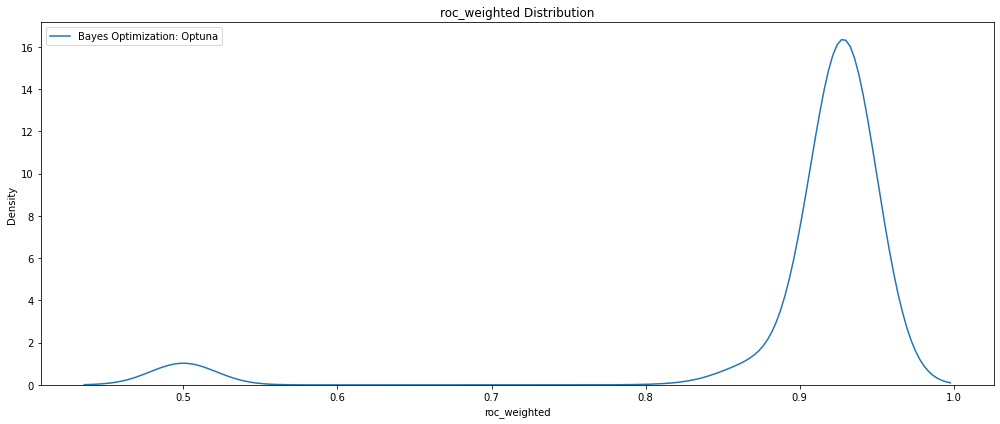

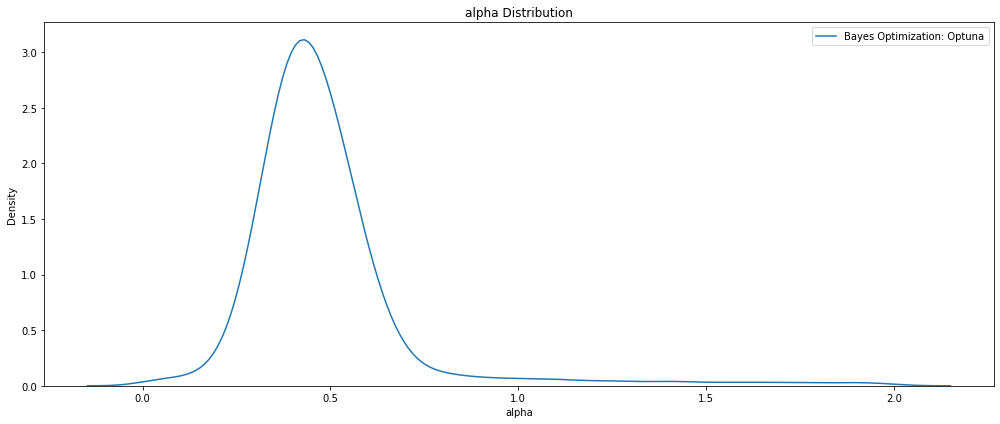

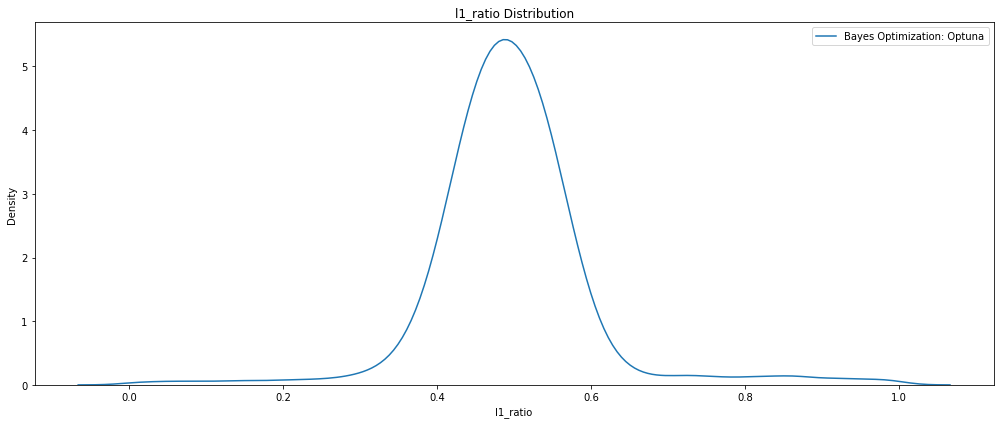

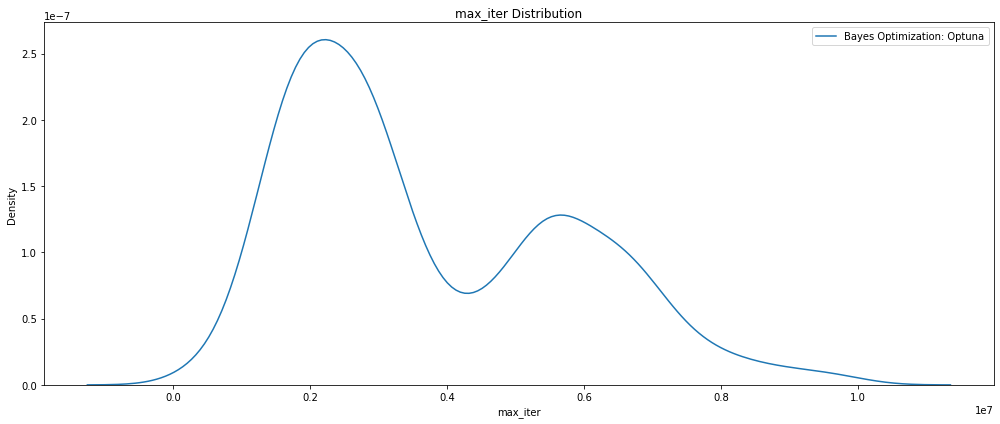

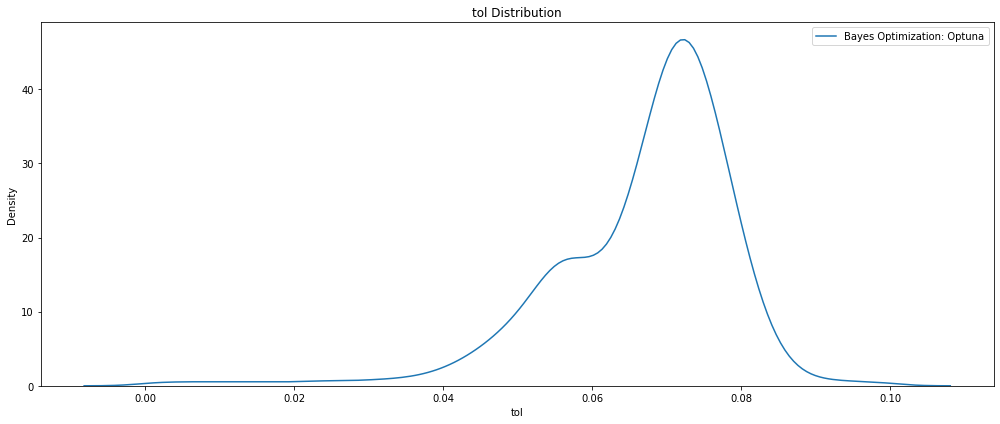

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize',
                   'selection', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

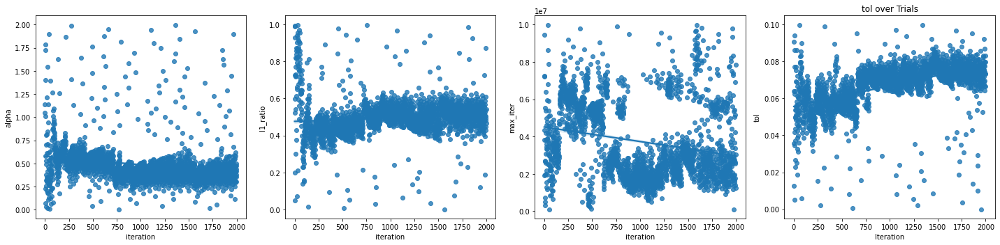

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'l1_ratio', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Elnet_Optuna_1000_GPU_ROCweighted.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 0.41181890202552773,
 'fit_intercept': True,
 'l1_ratio': 0.47230640451320854,
 'max_iter': 2104662,
 'normalize': False,
 'selection': 'random',
 'tol': 0.07347398371211919}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
# Set up features and target
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = ElasticNet(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Elnet_Optuna_trials1000_GPU_ROCweighted.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Elnet_Optuna_trials1000_GPU_ROCweighted.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Elastic Net HPO 1000 GPU ROC weighted')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Elastic Net HPO 1000 GPU ROC weighted


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       0.98      0.87      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.98      0.93      0.95    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[376695   1153]
 [  7105  47520]]


Accuracy score : 0.981
Precision score : 0.976
Recall score : 0.870
F1 score : 0.920


In [ ]:
# Evaluate on the testing data 
print('The best model from Elastic Net HPO 1000 ROC weighted GPU trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Elastic Net HPO 1000 ROC weighted GPU trials optimization scores 0.93344 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                     0
roc_weighted                                0.5
datetime_start       2022-06-12 19:11:28.281219
datetime_complete    2022-06-12 19:11:28.616162
duration                 0 days 00:00:00.334943
alpha                                  1.044438
fit_intercept                              True
l1_ratio                               0.200577
max_iter                              1908819.0
normalize                                  True
selection                                cyclic
tol                                    0.090671
state                                  COMPLETE
Name: 0, dtype: object


In [ ]:
################################################################################
######################         Recall Score       ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_elnet_optuna_US_1000_Recall_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0,
                   l1_ratio=0.5, max_iter=1e6, 
                   tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Recall of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                       max_iter=max_iter, tol=tol, 
                       selection=selection, fit_intercept=fit_intercept, 
                       normalize=normalize, verbose=verbose, handle=handle)  
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = recall_score(y_test.to_numpy(), cupy.asnumpy(y_pred)) 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial Recall score:', score)
    print('######################################################')
    
    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 0.771332368000003
- Trial Recall score: 0.8462242562929062
######################################################
Score with default parameters :  0.8462242562929062


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Elnet_Optuna_1000_GPU_Recall.pkl')
     
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    l1_ratio = trial.suggest_float('l1_ratio', 0, 1)
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    normalize = trial.suggest_categorical('normalize', [True, False])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, l1_ratio=l1_ratio,
                           max_iter=max_iter, tol=tol, 
                           selection=selection,
                           fit_intercept=fit_intercept, 
                           normalize=normalize, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Elnet_Optuna_1000_GPU_Recall.pkl'): 
        study = joblib.load('Elnet_Optuna_1000_GPU_Recall.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest Recall score:', study.best_value)

Start Time           2022-06-13 02:15:21.524059
- Trial time: 0.3067125620000297
- Trial Recall score: 0.8875057208237986
######################################################
- Trial time: 0.3235902429996713
- Trial Recall score: 0.878700228832952
######################################################
- Trial time: 0.31747069899984126
- Trial Recall score: 0.8790297482837529
######################################################
- Trial time: 0.308026861000144
- Trial Recall score: 0.8876338672768879
######################################################
- Trial time: 0.3212899740001376
- Trial Recall score: 0.878462242562929
######################################################
- Trial time: 0.3103592649999882
- Trial Recall score: 0.8860045766590389
######################################################
- Trial time: 0.31288069899983384
- Trial Recall score: 0.8877254004576659
######################################################
- Trial time: 0.3075670060002267
- Trial Recall sc

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'recall'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_l1_ratio':'l1_ratio'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('recall', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Elnet_Optuna_1000_GPU_Recall.csv', index=False)

      iteration    recall             datetime_start  \
962         962  0.000000 2022-06-12 19:38:45.158402   
2930       2930  0.000000 2022-06-13 02:39:15.133733   
2101       2101  0.000000 2022-06-13 02:17:40.662781   
440         440  0.000000 2022-06-12 19:31:54.140797   
2120       2120  0.000000 2022-06-13 02:18:06.439089   
...         ...       ...                        ...   
2069       2069  0.888183 2022-06-13 02:16:57.073317   
882         882  0.888183 2022-06-12 19:37:34.165544   
999         999       NaN 2022-06-12 19:39:18.500764   
1999       1999       NaN 2022-06-12 22:02:58.161617   
2999       2999       NaN 2022-06-13 02:41:17.770681   

              datetime_complete               duration     alpha  \
962  2022-06-12 19:38:45.954470 0 days 00:00:00.796068  0.575372   
2930 2022-06-13 02:39:16.951685 0 days 00:00:01.817952  0.605719   
2101 2022-06-13 02:17:42.107351 0 days 00:00:01.444570  0.419133   
440  2022-06-12 19:31:54.737362 0 days 00:00:00.596565 

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'l1_ratio', 
                                                       'max_iter', 'tol'])
py.plot(fig, filename='contour_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize',
                   'selection', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'l1_ratio', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Elnet_Optuna_1000_GPU_Recall.html')
fig.show()

In [ ]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 0.5244214794345927,
 'fit_intercept': True,
 'l1_ratio': 0.6254534362121152,
 'max_iter': 4864774,
 'normalize': False,
 'selection': 'cyclic',
 'tol': 0.07730180114144032}

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Set up train/test split
# Set up features and target
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [ ]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [ ]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [ ]:
# Re-create the best model and train on the training data
best_model = ElasticNet(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Elnet_Optuna_trials1000_GPU_Recall.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Elnet_Optuna_trials1000_GPU_Recall.pkl')
# print(model)
# =============================================================================

In [ ]:
print('\nModel Metrics for Elastic Net HPO 1000 GPU Recall')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Elastic Net HPO 1000 GPU Recall


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97    377848
           1       0.76      0.89      0.82     54625

    accuracy                           0.95    432473
   macro avg       0.87      0.92      0.89    432473
weighted avg       0.95      0.95      0.95    432473



Confusion matrix:
[[362138  15710]
 [  6108  48517]]


Accuracy score : 0.950
Precision score : 0.755
Recall score : 0.888
F1 score : 0.816


In [ ]:
# Evaluate on the testing data 
print('The best model from Elastic Net HPO 1000 Recall GPU trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Elastic Net HPO 1000 Recall GPU trials optimization scores 0.92330 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                   962
recall                                      0.0
datetime_start       2022-06-12 19:38:45.158402
datetime_complete    2022-06-12 19:38:45.954470
duration                 0 days 00:00:00.796068
alpha                                  0.575372
fit_intercept                              True
l1_ratio                               0.548863
max_iter                               811744.0
normalize                                  True
selection                                cyclic
tol                                    0.075653
state                                  COMPLETE
Name: 962, dtype: object


In [ ]:
################################################################################
######################        Precision Score     ##############################
######################         1000 Trials        ##############################
################################################################################
# Define a name for the trials
study_name = 'dask_elnet_optuna_US_1000_Precision_tpe'

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [ ]:
# Define function to train/evaluate the model
def train_and_eval(X_param, y_param, alpha=1.0,
                   l1_ratio=0.5, max_iter=1e6, 
                   tol=1e-3, selection='cyclic', 
                   fit_intercept=True, normalize=False, verbose=0,
                   handle=None): 
    '''
        Partition data into train/test sets, train and evaluate the model
        for the given parameters.
        
        Params
        ______
        
        X_param:  DataFrame. 
                  The data to use for training and testing. 
        y_param:  Series. 
                  The label for training

        Returns
        score: Precision of the fitted model
    '''
    X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')

    X_train = cudf.get_dummies(X_train, columns=cat_cols) 
    X_train = X_train.astype('float32')

    X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

    X_test = cudf.get_dummies(X_test, columns=cat_cols1)
    X_test = X_test.astype('float32')

    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                       max_iter=max_iter, tol=tol, 
                       selection=selection, fit_intercept=fit_intercept, 
                       normalize=normalize, verbose=verbose, handle=handle)  
    
    # Start timer for each trial
    start = timer()

    model.fit(X_train, y_train)
    
    p_pred = model.predict(X_test)
    p_pred = p_pred.round(2)
    y_pred = cupy.where(p_pred > 0.5, 1, 0)

    score = precision_score(y_test.to_numpy(), cupy.asnumpy(y_pred)) 

    run_time = timer() - start

    print('- Trial time:', run_time) 
    print('- Trial Precision score:', score)
    print('######################################################')
    
    return score

In [ ]:
print('Score with default parameters : ', train_and_eval(X_train, y_train))

- Trial time: 1.310521236000568
- Trial Precision score: 0.9985095260724932
######################################################
Score with default parameters :  0.9985095260724932


In [ ]:
# Define objective function with the parameters to be tested
def objective(trial, X_param, y_param):
    
    joblib.dump(study, 'Elnet_Optuna_1000_GPU_Precision.pkl')
     
    # Search parameters
    alpha = trial.suggest_float('alpha', 1e-3, 2.0) 
    l1_ratio = trial.suggest_float('l1_ratio', 0, 1)
    max_iter = trial.suggest_int('max_iter', 1e5, 1e7) 
    tol = trial.suggest_float('tol', 1e-5, 1e-1)  
    selection = trial.suggest_categorical('selection', ['cyclic', 'random'])
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    normalize = trial.suggest_categorical('normalize', [True, False])
    
    score = train_and_eval(X_param, y_param, 
                           alpha=alpha, l1_ratio=l1_ratio,
                           max_iter=max_iter, tol=tol, 
                           selection=selection,
                           fit_intercept=fit_intercept, 
                           normalize=normalize, 
                           handle=None, 
                           verbose=0)

    return score

In [ ]:
with timed('dask_optuna'):
    # Begin HPO trials 
    # Start timer for experiment
    start_time = datetime.now()
    
    print('%-20s %s' % ('Start Time', start_time))
    if os.path.isfile('Elnet_Optuna_1000_GPU_Precision.pkl'): 
        study = joblib.load('Elnet_Optuna_1000_GPU_Precision.pkl')
    else: 
        study = optuna.create_study(sampler=optuna.samplers.TPESampler(), 
                                    study_name=study_name,
                                    direction='maximize')

    # Optimize in parallel on Dask cluster
    with parallel_backend('dask'):
        study.optimize(lambda trial: objective(trial, X_train, y_train), 
                       n_trials=1000)

# End timer for experiment
end_time = datetime.now()
print('%-20s %s' % ('Start Time', start_time))
print('%-20s %s' % ('End Time', end_time))
print(str(timedelta(seconds=(end_time-start_time).seconds)))
print('\n')
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest ROC weighted score:', study.best_value)

Start Time           2022-06-13 15:52:51.899633
- Trial time: 0.45539861600082077
- Trial Precision score: 0.9985107016722693
######################################################
- Trial time: 0.7178332819985371
- Trial Precision score: 0.9925869120654397
######################################################
- Trial time: 0.4482718359995488
- Trial Precision score: 0.9985108917631041
######################################################
- Trial time: 0.5295699330017669
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.8685558569995919
- Trial Precision score: 0.999588975901008
######################################################
- Trial time: 0.9587634910003544
- Trial Precision score: 0.999978350292271
######################################################
- Trial time: 0.512090428999727
- Trial Precision score: 0.9999785403120238
######################################################
- Trial time: 0.33349068300049

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6032344220002415
- Trial Precision score: 0.9998705948324204
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4429712330002076
- Trial Precision score: 0.998531914893617
######################################################
- Trial time: 0.7720791600004304
- Trial Precision score: 0.8814893004510124
######################################################
- Trial time: 0.45414010400054394
- Trial Precision score: 0.9985106382978723
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5059570769990387
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 1.3412534700000833
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.44788155000060215
- Trial Precision score: 0.9985105432261634
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45724133900148445
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5164078799989511
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5106314800013934
- Trial Precision score: 0.9999785320194929
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5159175659991888
- Trial Precision score: 0.9999785384697929
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45840035500077647
- Trial Precision score: 0.9985107333574452
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.3277886480009329
- Trial Precision score: 0.0
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4625156550009706
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4593767950009351
- Trial Precision score: 0.9984891688300634
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5054536240004381
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4610418430002028
- Trial Precision score: 0.9985104798382807
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5083842969997932
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5158997629987425
- Trial Precision score: 0.9999785444558874
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6303056790002302
- Trial Precision score: 0.9999135004216855
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5239663009997457
- Trial Precision score: 0.9999785278708236
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5093754589997843
- Trial Precision score: 0.9999785389303802
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45602015999975265
- Trial Precision score: 0.998510669985745
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.789155069998742
- Trial Precision score: 0.8815953868332532
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5204083469998295
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5141075249994174
- Trial Precision score: 0.9999785380091857
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.8593067870006053
- Trial Precision score: 0.9999782986111111
######################################################
- Trial time: 0.4517064890005713
- Trial Precision score: 0.998531914893617
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.518502136999814
- Trial Precision score: 0.9999785370879121
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.765433597000083
- Trial Precision score: 0.9999784510623626
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3328130099998816
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.45015032700030133
- Trial Precision score: 0.9985104798382807
######################################################
- Trial time: 0.4549757570002839
- Trial Precision score: 0.998510669985745
######################################################
- Trial time: 0.33124999400024535
- Trial Precision score: 0.0
######################################################
- Trial time: 0.5187242579995655
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.5055220369995368
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5676968070001749
- Trial Precision score: 0.9996342591596566
######################################################
- Trial time: 0.5192112189997715
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 1.3435441390010965
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.44166309100000944
- Trial Precision score: 0.998510669985745
######################################################
- Trial time: 0.7912562809997326
- Trial Precision score: 0.8814144027598103
######################################################
- Trial time: 0.5241201210010331
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.9589715589991101
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.5043603389985947
- Trial Precision score: 0.9999785393909479

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5136626720013737
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7764546509970387
- Trial Precision score: 0.8815331010452961
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9429118090010888
- Trial Precision score: 0.999978349823551
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7385877930028073
- Trial Precision score: 0.9983459712585655
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.322399585002131
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.9522419119966798
- Trial Precision score: 0.9999783493548108
######################################################
- Trial time: 0.45264096800019615
- Trial Precision score: 0.9984676612680103
######################################################
- Trial time: 0.7339239680004539
- Trial Precision score: 0.9966180059077872
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5200776709971251
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.9575806319990079
- Trial Precision score: 0.9999567174515236
######################################################
- Trial time: 0.9566676110007393
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.5268394550002995
- Trial Precision score: 0.9999785398514958
######################################################
- Trial time: 0.511067188999732
- Trial Precision score: 0.9999785444558874
######################################################
- Trial time: 0.9532957589981379
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.3298390060008387
- Trial Precision score: 0.0
######################################################
- Trial time: 0.5777526739984751
- Trial Precision score: 0.9996127283289228
###############

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.46029893300146796
- Trial Precision score: 0.998209833130874
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.507596621002449
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6076100600002974
- Trial Precision score: 0.9998705725009707
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5183422010013601
- Trial Precision score: 0.9999785380091857
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7421647219998704
- Trial Precision score: 0.9983245983331901
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45894266799950856
- Trial Precision score: 0.998510448142316
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7864625479996903
- Trial Precision score: 0.8815909418030035
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5227602240011038
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9651748670003144
- Trial Precision score: 0.9999783488860502
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5239349749972462
- Trial Precision score: 0.9999785384697929
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5132023379992461
- Trial Precision score: 0.9999785375485588
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3374816850009665
- Trial Precision score: 0.9999782971981683
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5140592730022036
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5043510789982975
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5035519189987099
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4531954060003045
- Trial Precision score: 0.9984890402213237
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4581449280012748
- Trial Precision score: 0.9985105432261634
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4521228639969195
- Trial Precision score: 0.9985107333574452
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.34118887599834125
- Trial Precision score: 0.0
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5171598810011346
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.636923272999411
- Trial Precision score: 0.999978391927224
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5171777639989159
- Trial Precision score: 0.9999785398514958
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5181606099977216
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9602777090003656
- Trial Precision score: 0.9999350747722207
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7888267050002469
- Trial Precision score: 0.881672319645907
######################################################
- Trial time: 1.337001784999302
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.5204587619991798
- Trial Precision score: 0.9999785393909479
######################################################
- Trial time: 0.518819340999471
- Trial Precision score: 0.9999785407725322
######################################################
- Trial time: 0.5072340469996561
- Trial Precision score: 0.9999785255653145
######################################################
- Trial time: 0.5116049040007056
- Trial Precision score: 0.9999785449162178
######################################################
- Trial time: 0.5164782360006939
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.5219554480027
- Trial Precision score: 0.9999785416934895
#####

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45866188800209784
- Trial Precision score: 0.9982965313118838
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4988101259987161
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.4516824300008011
- Trial Precision score: 0.9982528657263391
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.8679372670012526
- Trial Precision score: 0.9987055853990033
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5859318699986034
- Trial Precision score: 0.9996127449925776
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44439673899978516
- Trial Precision score: 0.998403066113063
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7644261569985247
- Trial Precision score: 0.8671322094472267
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5230748440008028
- Trial Precision score: 0.9999785384697929
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5236891370004741
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.46178236700143316
- Trial Precision score: 0.9984676612680103
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7032897870012675
- Trial Precision score: 0.9855038825118163
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44297814200035646
- Trial Precision score: 0.9985108917631041
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5163601770000241
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9528559769969434
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.9609137090010336
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.45274176900056773
- Trial Precision score: 0.9985107333574452
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.958838795999327
- Trial Precision score: 0.9999783493548108
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44630367499848944
- Trial Precision score: 0.9984889759087426
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.32840734199999133
- Trial Precision score: 0.0
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44603616499807686
- Trial Precision score: 0.9985105432261634
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5223328939973726
- Trial Precision score: 0.9999785398514958
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5200969079996867
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6153676119974989
- Trial Precision score: 0.9998705948324204
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5180800380003348
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3387696239988145
- Trial Precision score: 0.9999782971981683
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44520701199871837
- Trial Precision score: 0.9985107016722693
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7904370539981755
- Trial Precision score: 0.8813372608185454
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45317889699799707
- Trial Precision score: 0.9985107016722693
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5200264569975843
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4570976379982312
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5229922830003488
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45936805800010916
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5072690089982643
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.44026527399910265
- Trial Precision score: 0.9985106066086512
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5281321669972385
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.996857768001064
- Trial Precision score: 0.9999782995529708
######################################################
- Trial time: 0.7348746550014766
- Trial Precision score: 0.9988821291140874
######################################################
- Trial time: 0.32433562699952745
- Trial Precision score: 0.0
######################################################
- Trial time: 0.9563775810020161
- Trial Precision score: 0.9999783493548108
######################################################
- Trial time: 0.45905064399994444
- Trial Precision score: 0.998510669985745
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5136416780005675
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6027808079998067
- Trial Precision score: 0.9998705613323553
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3410787019965937
- Trial Precision score: 0.9999782986111111
######################################################
- Trial time: 0.9727852639989578
- Trial Precision score: 0.9999783484172693
######################################################
- Trial time: 0.7839274549987749
- Trial Precision score: 0.8817331055885679
######################################################
- Trial time: 0.5227764400005981
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.5184316230006516
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.5244637360010529
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.9548728549998486
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.5134587499996996
- Trial Precision score: 0.9999785398514958

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9705237899979693
- Trial Precision score: 0.999978349823551
######################################################
- Trial time: 0.5162090519988851
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.3240446370000427
- Trial Precision score: 0.0
######################################################
- Trial time: 0.5166635509995103
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5149215240016929
- Trial Precision score: 0.9999785380091857
######################################################
- Trial time: 1.3362735150003573
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.49511186300151167
- Trial Precision score: 0.9692421868557763
######################################################
- Trial time: 1.3333425839991833
- Trial Precision score: 0.9999782976691697
######################################################
- Trial time: 0.4517351089998556
- Trial Precision score: 0.998531914893617
######################################################
- Trial time: 0.4568864040011249
- Trial Precision score: 0.998489136679931
######################################################
- Trial time: 0.5180568389987457
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.504348521000793
- Trial Precision score: 0.6304778495064385
#

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.45925914100007503
- Trial Precision score: 0.9984890723755613
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5056259099983436
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3255786139998236
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.9543569140005275
- Trial Precision score: 0.999978349823551
######################################################
- Trial time: 0.5139004230004502
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4509633779998694
- Trial Precision score: 0.9984676612680103
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5189090339990798
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3455146199994488
- Trial Precision score: 0.9999782971981683
######################################################
- Trial time: 0.5173653310012014
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.9593311600001471
- Trial Precision score: 0.999978349823551
######################################################
- Trial time: 0.33761865199994645
- Trial Precision score: 0.0
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5161581130014383
- Trial Precision score: 0.9999785380091857
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4483734919995186
- Trial Precision score: 0.9984463787856216
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6199023949993716
- Trial Precision score: 0.9998706032047273
######################################################
- Trial time: 0.5209697030004463
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.516401387998485
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5203464830010489
- Trial Precision score: 0.9999785421539386
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7863892940004007
- Trial Precision score: 0.8804764740917213
######################################################
- Trial time: 0.5199762339980225
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.5219705759991484
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9621588859990879
- Trial Precision score: 0.9999783488860502
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5294220920004591
- Trial Precision score: 0.9999785444558874
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4472166260020458
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.345734567999898
- Trial Precision score: 0.9999782995529708
######################################################
- Trial time: 0.5239498439987074
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.454799319999438
- Trial Precision score: 0.9984460811443654
######################################################
- Trial time: 0.9572316990015679
- Trial Precision score: 0.9999783488860502
######################################################
- Trial time: 0.5196422979970521
- Trial Precision score: 0.9999785292538915
######################################################
- Trial time: 0.33080669199989643
- Trial Precision score: 0.0
######################################################
- Trial time: 0.5113253009985783
- Trial Precision score: 0.9999785416934895
######################################################
- Trial time: 0.9731110350003291
- Trial Precision score: 0.999978349823551
################

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6155915650015231
- Trial Precision score: 0.9998705976233097
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4401797210011864
- Trial Precision score: 0.9984244256605702
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.330356947000837
- Trial Precision score: 0.9999782971981683
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9420799540021108
- Trial Precision score: 0.9999783488860502
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4585153750012978
- Trial Precision score: 0.9982962047961835
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.7508480180003971
- Trial Precision score: 0.867078569230405
######################################################
- Trial time: 0.7082443120016251
- Trial Precision score: 0.9877452536668995
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.8669826089972048
- Trial Precision score: 0.9995243757431629
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.4543651649983076
- Trial Precision score: 0.9985108917631041
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5214516310006729
- Trial Precision score: 0.9999785416934895
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.9518237240008602
- Trial Precision score: 0.9999783488860502
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.6463543549980386
- Trial Precision score: 0.9989680304431019
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 1.3366459110002324
- Trial Precision score: 0.99997830002387
######################################################
- Trial time: 0.44604624299972784
- Trial Precision score: 0.998489136679931
######################################################


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


- Trial time: 0.5248945150015061
- Trial Precision score: 0.9999785416934895
######################################################
..dask_optuna             :  2891.9932
Start Time           2022-06-13 15:52:51.899633
End Time             2022-06-13 16:41:03.893225
0:48:11


Number of finished trials: 5000
Best trial: {'alpha': 1.9994228130428073, 'l1_ratio': 0.9997135056766794, 'max_iter': 8323151, 'tol': 0.0263994736807191, 'selection': 'random', 'fit_intercept': True, 'normalize': False}
Highest ROC weighted score: 0.9999785449162178


In [15]:
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL

study = joblib.load('Elnet_Optuna_US_1000_GPU_Precision.pkl')

print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)
print('Highest precision', study.best_value)

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL
Number of finished trials: 5000
Best trial: {'alpha': 1.9994228130428073, 'l1_ratio': 0.9997135056766794, 'max_iter': 8323151, 'tol': 0.0263994736807191, 'selection': 'random', 'fit_intercept': True, 'normalize': False}
Highest precision 0.9999785449162178


In [26]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/trialOptions


In [ ]:
# Output from HPO trials
trials_df = study.trials_dataframe()
trials_df.rename(columns={'number':'iteration'}, inplace=True)
trials_df.rename(columns={'value':'precision'},inplace=True)
trials_df.rename(columns={'params_alpha':'alpha'}, inplace=True)
trials_df.rename(columns={'params_fit_intercept':'fit_intercept'}, inplace=True)
trials_df.rename(columns={'params_l1_ratio':'l1_ratio'}, inplace=True)
trials_df.rename(columns={'params_max_iter':'max_iter'}, inplace=True)
trials_df.rename(columns={'params_normalize':'normalize'}, inplace=True)
trials_df.rename(columns={'params_selection':'selection'}, inplace=True)
trials_df.rename(columns={'params_tol':'tol'}, inplace=True)

trials_df = trials_df.sort_values('precision', ascending=True)
print(trials_df) 

# Write processed data to csv
trials_df.to_csv('Elnet_Optuna_US_1000_GPU_Precision.csv', index=False)

      iteration  precision             datetime_start  \
0             0   0.000000 2022-06-12 19:43:37.979410   
2006       2006   0.000000 2022-06-13 03:15:15.402474   
658         658   0.000000 2022-06-12 19:51:33.545182   
4403       4403   0.000000 2022-06-13 16:10:56.937837   
638         638   0.000000 2022-06-12 19:51:17.329359   
...         ...        ...                        ...   
1393       1393   0.999979 2022-06-12 22:25:47.122759   
999         999        NaN 2022-06-12 19:56:51.822921   
1999       1999        NaN 2022-06-12 22:39:10.448402   
2999       2999        NaN 2022-06-13 03:43:18.745094   
3999       3999        NaN 2022-06-13 14:01:49.580563   

              datetime_complete               duration     alpha  \
0    2022-06-12 19:43:38.410555 0 days 00:00:00.431145  1.260111   
2006 2022-06-13 03:15:16.593647 0 days 00:00:01.191173  1.887589   
658  2022-06-12 19:51:34.238484 0 days 00:00:00.693302  1.948701   
4403 2022-06-13 16:10:59.411223 0 days 00:0

In [ ]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_Explanations


In [ ]:
# Plot_optimization_histor: shows the scores from all trials as well as the best score so far at each point.
fig = optuna.visualization.plot_optimization_history(study)
py.plot(fig, filename='optimizationHistory_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_parallel_coordinate: interactively visualizes the hyperparameters and scores
fig = optuna.visualization.plot_parallel_coordinate(study)
py.plot(fig, filename='parallelCoordinate_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


In [ ]:
# plot_slice: shows the change of the hyperparamters space over the search. 
fig = optuna.visualization.plot_slice(study)
py.plot(fig, filename='slice_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# plot_contour: plots parameter interactions on an interactive chart. 
fig = optuna.visualization.plot_contour(study, params=['alpha', 'l1_ratio', 
                                                       'max_iter', 'tol'])
py.plot(fig, filename='contour_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Create plots of Hyperparameters that are numeric 
for i, hpo in enumerate(trials_df.columns):
    if hpo not in ['iteration', 'datetime_start', 'datetime_complete',
                   'duration','fit_intercept', 'normalize',
                   'selection', 'state']:
        plt.figure(figsize = (14, 6))
        # Plot the random search distribution and the bayes search distribution
        if hpo != 'loss':
            sns.kdeplot(trials_df[hpo], label = 'Bayes Optimization: Optuna')
            plt.legend(loc = 0)
            plt.title('{} Distribution'.format(hpo))
            plt.xlabel('{}'.format(hpo)); plt.ylabel('Density')
            plt.tight_layout()
            plt.show()

In [ ]:
# Plot quantitive hyperparameters
fig, axs = plt.subplots(1, 4, figsize = (20, 5))
i = 0
axs = axs.flatten()
for i, hpo in enumerate(['alpha', 'l1_ratio', 'max_iter', 'tol']): 

                        # Scatterplot
                         sns.regplot('iteration', hpo, data = trials_df, ax = axs[i]) 
axs[i].set(xlabel = 'Iteration', ylabel = '{}'.format(hpo),  
                                    title = '{} over Trials'.format(hpo))

plt.tight_layout()
plt.show()

In [ ]:
# Visualize parameter importances
fig = optuna.visualization.plot_param_importances(study)
py.plot(fig, filename='paramImportance_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

In [ ]:
# Visualize empirical distribution function
fig = optuna.visualization.plot_edf(study)
py.plot(fig, filename='edf_Elnet_Optuna_1000_GPU_Precision.html')
fig.show()

In [16]:
# Arrange best parameters to fit model for model metrics
params=study.best_params   
params

{'alpha': 1.9994228130428073,
 'fit_intercept': True,
 'l1_ratio': 0.9997135056766794,
 'max_iter': 8323151,
 'normalize': False,
 'selection': 'random',
 'tol': 0.0263994736807191}

In [17]:
# Write results to ML Results
%cd /content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL/

/content/drive/MyDrive/LoanStatus/ML/Linear/Optuna/Model_PKL


In [18]:
# Set up train/test split
# Set up features and target
X_train, y_train = trainDF.drop('loan_status', axis=1), trainDF['loan_status'].astype('int32')
X_test, y_test= testDF.drop('loan_status', axis=1), testDF['loan_status'].astype('int32')

In [19]:
X_train = cudf.get_dummies(X_train, columns=cat_cols)
X_train = X_train.astype('float32')

In [20]:
X_test = cudf.get_dummies(X_test, columns=cat_cols1)
X_test = X_test.astype('float32')

In [21]:
# Re-create the best model and train on the training data
best_model = ElasticNet(**params)

# Fit the model
best_model.fit(X_train, y_train)

# Save model
Pkl_Filename = 'Elnet_Optuna_trials1000_GPU_Precision.pkl'  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(best_model, file)

# =============================================================================
# # To load saved model
# model = joblib.load('Elnet_Optuna_trials1000_GPU_Precision.pkl')
# print(model)
# =============================================================================

In [22]:
print('\nModel Metrics for Elastic Net HPO 1000 GPU Precision')
# Predict based on training 
y_train_pred = best_model.predict(X_train)
y_train_pred = y_train_pred.round(2)
y_train_pred = cupy.where(y_train_pred > 0.5, 1, 0)

y_test_pred = best_model.predict(X_test)
y_test_pred = y_test_pred.round(2)
y_test_pred = cupy.where(y_test_pred > 0.5, 1, 0)

print('\n')
print('Classification Report:')
clf_rpt = classification_report(y_test.to_numpy(), cupy.asnumpy(y_test_pred))
print(clf_rpt)
print('\n')
print('Confusion matrix:')
print(confusion_matrix(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('\n')
print('Accuracy score : %.3f'%accuracy_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Precision score : %.3f'%precision_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))
print('Recall score : %.3f'%recall_score(y_test.to_numpy(),cupy.asnumpy(y_test_pred)))
print('F1 score : %.3f'%f1_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred)))


Model Metrics for Elastic Net HPO 1000 GPU Precision


Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    377848
           1       1.00      0.85      0.92     54625

    accuracy                           0.98    432473
   macro avg       0.99      0.93      0.96    432473
weighted avg       0.98      0.98      0.98    432473



Confusion matrix:
[[377847      1]
 [  8017  46608]]


Accuracy score : 0.981
Precision score : 1.000
Recall score : 0.853
F1 score : 0.921


In [28]:
# Evaluate on the testing data 
print('The best model from Elastic Net HPO 1000 Precision GPU trials optimization scores {:.5f} AUC ROC on the test set.'.format(roc_auc_score(y_test.to_numpy(), cupy.asnumpy(y_test_pred))))
print('This was achieved using these conditions:')
print(trials_df.iloc[0])

The best model from Elastic Net HPO 1000 Precision GPU trials optimization scores 0.92662 AUC ROC on the test set.
This was achieved using these conditions:
iteration                                     0
precision                                   0.0
datetime_start       2022-06-12 19:43:37.979410
datetime_complete    2022-06-12 19:43:38.410555
duration                 0 days 00:00:00.431145
alpha                                  1.260111
fit_intercept                              True
l1_ratio                               0.769215
max_iter                              5181866.0
normalize                                  True
selection                                cyclic
tol                                    0.030348
state                                  COMPLETE
Name: 0, dtype: object
